#### Import libraries

In [1]:
import math
import csv
import os
import copy
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from matplotlib.ticker import StrMethodFormatter

#### Import ProcessEmbryo and check it's working (by printing version date)

In [2]:
import ProcessEmbryo
print(ProcessEmbryo.__version__)

25.06.04


#### Run stack processing

In [3]:
# indicate a name of stack folder in the same folder or give an absolute path
stack_path = os.path.join(os.getcwd(), '250320_stack2')
# stack_path = os.path.abspath(MANUAL_ABSOLUTE_PATH_STRING)

**vvv Builds stack from raw extraction files - only run when needed! vvv**

In [4]:
force_reprocess_stack = True

if force_reprocess_stack or not os.path.isfile(os.path.join(stack_path, 'processed.stack')):
    processed_stack = ProcessEmbryo.process_stack(stack_path, channels = 2, channel_metric = "MeanIntensity_warp")
    ProcessEmbryo.save_stack(processed_stack)


Processing 250320_stack2

Loading the lineage tree graph:
Lineage tree graph loaded successfully

Loading channel extractions:
Histone loaded
Signal_1 loaded

Reconstructing cell lineages:
Processing 250320_stack2 lineage 1 / 106
Processing 250320_stack2 lineage 2 / 106
Processing 250320_stack2 lineage 3 / 106
Processing 250320_stack2 lineage 4 / 106
Processing 250320_stack2 lineage 5 / 106
Processing 250320_stack2 lineage 6 / 106
Processing 250320_stack2 lineage 7 / 106
Processing 250320_stack2 lineage 8 / 106
Processing 250320_stack2 lineage 9 / 106
Processing 250320_stack2 lineage 10 / 106
Processing 250320_stack2 lineage 11 / 106
Processing 250320_stack2 lineage 12 / 106
Processing 250320_stack2 lineage 13 / 106
Processing 250320_stack2 lineage 14 / 106
Processing 250320_stack2 lineage 15 / 106
Processing 250320_stack2 lineage 16 / 106
Processing 250320_stack2 lineage 17 / 106
Processing 250320_stack2 lineage 18 / 106
Processing 250320_stack2 lineage 19 / 106
Processing 250320_sta

#### Set global configs

In [5]:
Z_isotropy_factor = 9.6 # rescaling factor for the Z coordinate
frames_per_hour = 4 # frames-to-hours conversion factor
zero_division_epsilon = 0.0001 # constant preventing division by zero
frames_per_hour = 4 # rescaling factor to convert frames to hours
division_line_style = ['black', (0, (2, 4)), 1] # plotting settings used for vertical division lines
deriv_thresh = 0.02

In [6]:
plot_path = os.path.join(stack_path, 'Plots')
if not os.path.exists(plot_path):
    os.mkdir(plot_path)

#### Load saved stack

In [46]:
stack = ProcessEmbryo.get_stack(os.path.join(stack_path, 'processed.stack'))

#### Check terminal cell IDs

In [47]:
IDs = []
for cell in stack[0]:
    IDs.append(cell[0][1])
IDs.sort()
print('Last frame:', stack[0][0][0][0])
print('Leaf cell IDs:', IDs)
print('Total reconstructed lineages:',len(IDs))

Last frame: 81
Leaf cell IDs: [1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 72, 73, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 102, 103, 104, 105, 106, 107, 108, 452, 560]
Total reconstructed lineages: 103


#### Define supporting functions (will be moved into the main package later)

In [48]:
def cell_exists(search_stack_track, cell_ID, echo = True): # returns whether queried cell exists in the stack
    found = False
    for pair in search_stack_track:
        found = (pair[0] == cell_ID) or (pair[1] == cell_ID)
        if found:
            break
    if not found and echo:
        print('Cell ' + str(cell_ID[0]) + '_' + str(cell_ID[1]) + ' not found in the tree')
    return found

In [49]:
def minimal_rectangle(N):
    """
    Calculates the dimensions of a minimal X by Y rectangular grid that can contain N elements
    """
    X = int(round(math.sqrt(N), 0))
    Y = N // X
    
    if N % X > 0:
        Y += 1
    
    return X, Y

In [50]:
def colsel_by_fate(fate_name): # returns color string based of fate name
    if fate_name == 'ICM':
        color = 'purple'
    elif fate_name == 'TE':
        color = 'brown'
    else:
        color = 'black'
        print('Fate-based color selection failed, defaulted to ' + color)
    return color

In [51]:
def colsel_by_signal(signal_name): # returns color string based of signal name
    if signal_name == 'histone':
        color = 'darkgrey'
    elif signal_name == 'fucci':
        color = 'darkred'
    else:
        color = 'black'
        print('Fate-based color selection failed, defaulted to ' + color)
    return color

In [52]:
def smoothen_trace(raw_trace, method = "average", kernel_size = 1): # returns a smoothened version of a signal trace
    if kernel_size == 0:
        return raw_trace
    
    else:
        temp_trace = []
        for i in range(kernel_size):
            temp_trace.append(math.nan)
        for point in raw_trace:
            temp_trace.append(point)
        for i in range(kernel_size):
            temp_trace.append(math.nan)

        out_trace = []
        for i in range(kernel_size, len(raw_trace) + kernel_size, 1):
            cur_val = 0
            cur_kern = 0
            
            if method == "average":
                for j in range(i - kernel_size, i + kernel_size + 1, 1):
                    if not math.isnan(temp_trace[j]):
                        kern_weight = 1
                        cur_val += kern_weight * temp_trace[j]
                        cur_kern += kern_weight
                out_trace.append(cur_val / cur_kern)
                
            elif method == "inverse":
                for j in range(i - kernel_size, i + kernel_size + 1, 1):
                    if not math.isnan(temp_trace[j]):
                        kern_weight = 1 / (abs(i-j) + 1)
                        cur_val += kern_weight * temp_trace[j]
                        cur_kern += kern_weight
                out_trace.append(cur_val / cur_kern)
            
            else:
                raise ValueError("Invalid smoothing method requested")

        return out_trace

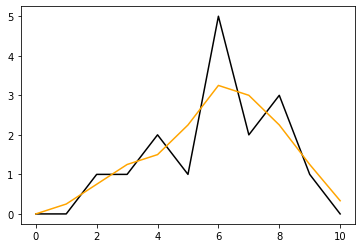

In [14]:
test_trace = [0,0,1,1,2,1,5,2,3,1,0]
test_smoothen_trace = smoothen_trace(test_trace, method = "inverse", kernel_size = 1)

plt.plot(test_trace, c='black')
plt.plot(test_smoothen_trace, c='orange')
plt.show()

#### Plot signal intensities for both channels in all cells

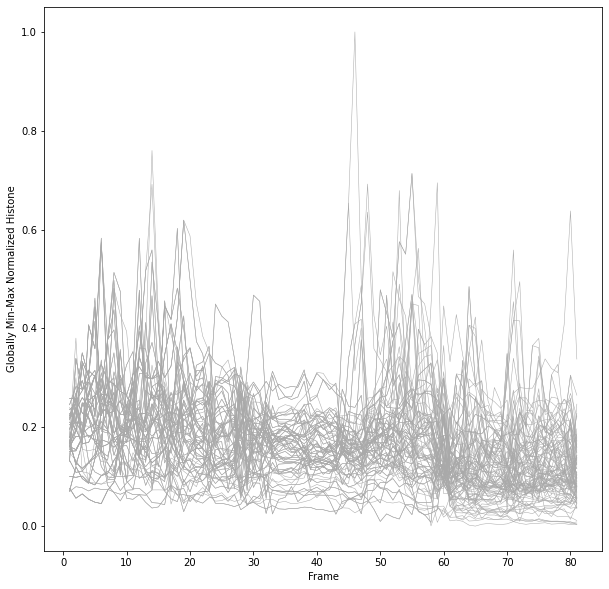

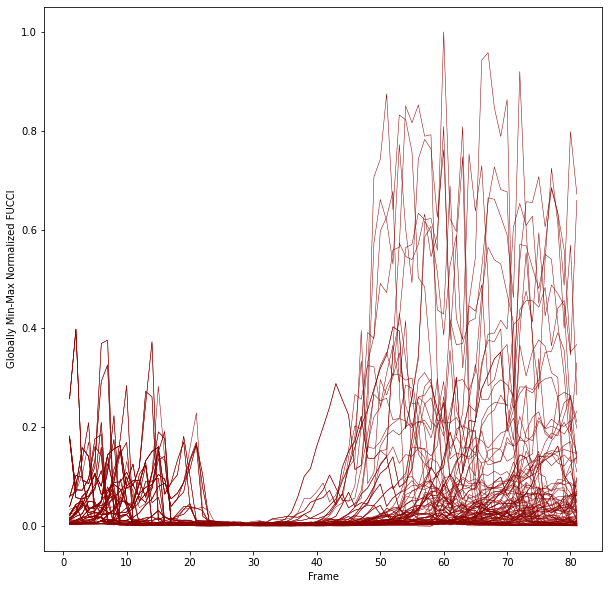

In [53]:
stack_name = stack[2][3][0]
stack_data = stack[0]
channels = len(stack[2][2][0])
channel_mins = stack[2][2][0]
channel_maxs = stack[2][2][1]

plot_channels = []
for c in range(channels):
    channel_tmp = []
    for lineage in stack_data:
        lineage_tmp = []
        for cell in lineage[1]:
            if (c + 5) <= (len(cell) - 1):
                temp = [cell[0], cell[c + 5]]
                lineage_tmp.append(temp)
        channel_tmp.append(lineage_tmp)
    plot_channels.append(channel_tmp)

plt.figure(figsize=(10, 10))
histone = plot_channels[0]
histone_traces = []
for trace in histone:
    temp_x = []
    temp_y = []
    for cell in trace:
        temp_x.append(cell[0])
        temp_y.append((cell[1] - channel_mins[0]) / (channel_maxs[0] - channel_mins[0] + zero_division_epsilon))
    histone_traces.append([temp_x, temp_y])
    
for trace in histone_traces:
    plt.plot(trace[0], trace[1], colsel_by_signal('histone'), linewidth = 0.5)
    
plt.ylabel("Globally Min-Max Normalized Histone")
plt.xlabel("Frame")
plt.show()

plt.figure(figsize=(10, 10))
fucci = plot_channels[1]
fucci_traces = []
for trace in fucci:
    temp_x = []
    temp_y = []
    for cell in trace:
        temp_x.append(cell[0])
        temp_y.append((cell[1] - channel_mins[1]) / (channel_maxs[1] - channel_mins[1] + zero_division_epsilon))
    fucci_traces.append([temp_x, temp_y])
    
for trace in fucci_traces:
    plt.plot(trace[0], trace[1], color = colsel_by_signal('fucci'), linewidth = 0.5)
    
plt.ylabel("Globally Min-Max Normalized FUCCI")
plt.xlabel("Frame")
plt.show()

In [16]:
print(stack[2][2][0])
print(stack[2][2][1])

[130.989511338437, 117.376676147907]
[865.424977210574, 1320.93562926153]


#### Get manual fate calls

In [54]:
# get the list of cells with called fate
cells_called = []
with open(os.path.join(stack_path, 'fate_calls.csv'), newline='') as csvfile:
    reader = csv.reader(csvfile, delimiter=',', quotechar='|')
    for row in reader:
        s1 = row[0].replace("'", '')
        s1_1 = int(s1[0:s1.find('_')])
        s1_2 = int(s1[s1.find('_') + 1 : len(s1)])
        if cell_exists(stack[1][0], [s1_1, s1_2]):
            cells_called.append([s1_1, s1_2, row[1]])
cells_called = np.array(cells_called)

# make a list of called fate
fate = []
for i in range(len(cells_called)):
    if cells_called[i][2] not in fate:
        fate.append(cells_called[i][2])

#### List all fates

In [55]:
print(fate)

['ICM', 'TE', 'death']


#### List all cells with fate calls

In [56]:
print(cells_called)

[['81' '1' 'ICM']
 ['81' '2' 'ICM']
 ['81' '4' 'TE']
 ['81' '5' 'TE']
 ['81' '6' 'death']
 ['81' '8' 'TE']
 ['81' '9' 'ICM']
 ['81' '10' 'TE']
 ['81' '11' 'TE']
 ['81' '12' 'TE']
 ['81' '13' 'ICM']
 ['81' '14' 'TE']
 ['81' '15' 'ICM']
 ['81' '16' 'TE']
 ['81' '17' 'TE']
 ['81' '18' 'TE']
 ['81' '19' 'TE']
 ['81' '20' 'TE']
 ['81' '21' 'TE']
 ['81' '22' 'TE']
 ['81' '23' 'TE']
 ['81' '24' 'TE']
 ['81' '25' 'ICM']
 ['81' '26' 'TE']
 ['81' '27' 'TE']
 ['81' '28' 'TE']
 ['81' '29' 'TE']
 ['81' '30' 'ICM']
 ['81' '32' 'ICM']
 ['81' '33' 'TE']
 ['81' '34' 'TE']
 ['81' '35' 'TE']
 ['81' '36' 'TE']
 ['81' '37' 'TE']
 ['81' '40' 'TE']
 ['81' '41' 'TE']
 ['81' '42' 'TE']
 ['81' '43' 'TE']
 ['81' '44' 'TE']
 ['81' '45' 'TE']
 ['81' '46' 'TE']
 ['81' '47' 'TE']
 ['81' '48' 'TE']
 ['81' '49' 'TE']
 ['81' '50' 'TE']
 ['81' '51' 'death']
 ['81' '52' 'TE']
 ['81' '53' 'TE']
 ['81' '54' 'TE']
 ['81' '55' 'TE']
 ['81' '56' 'TE']
 ['81' '57' 'ICM']
 ['81' '58' 'TE']
 ['81' '59' 'ICM']
 ['81' '60' 'ICM']


#### Reconstruct and process fate-called cells

In [57]:
fate_data = []

for p in fate:
    temp_cells = []

    for i in range(len(cells_called)):
        if cells_called[i][2] == p:
            temp_cells.append([int(cells_called[i][0]), int(cells_called[i][1])])

    temp_data = []
    for cell in temp_cells:
        # reconstruct lineage from leaf
        temp_lin = ProcessEmbryo.lineage_reconstruct(stack[1][0], stack[2][0], cell[0], cell[1])
        # extract reconstructed lineage
        temp_data.append([cell, ProcessEmbryo.lineage_express(ProcessEmbryo.lineage_transform(temp_lin[0]), stack[1][1]), temp_lin[1]])

    fate_data.append([p, temp_data])

In [22]:
# print first fate name
print(fate_data[0][0])
# print first cell's [frame, ID]
print(fate_data[0][1][0][0])
# print cell's first frame data [frame, ID, centroidX, cenbtroidY, centroidZ, histone, fucci]
print(fate_data[0][1][0][1][0])
# print cell's division frames as a list of [frame, ID]
print(fate_data[0][1][0][2])

ICM
[81, 1]
[1, 18, 578.54166857108, 374.88356414827, 468.975638740345, 291.181079269315, 133.436773466185]
[[7, 33], [64, 82]]


#### Plot <u>globally</u> min-max normalized FUCCI traces

Showing plots for ICM


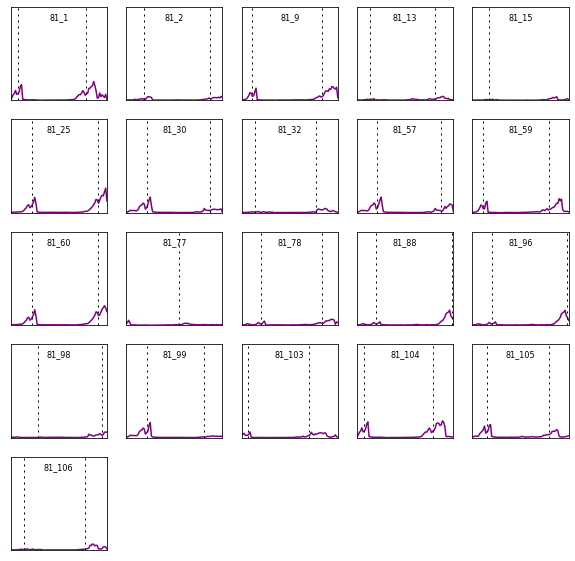

Showing plots for TE


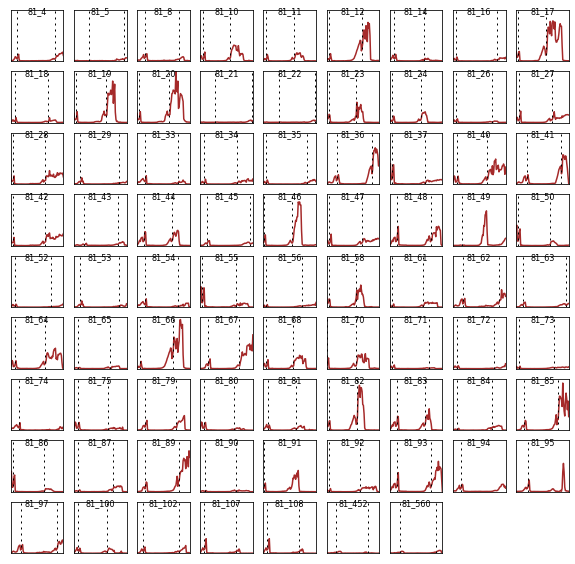

Showing plots for death
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


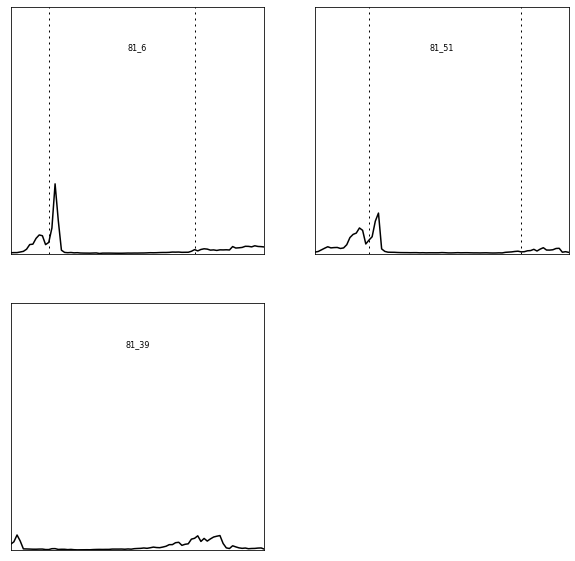

In [58]:
titles = True # add leaf cell IDs as plot titles
div_lines = True # add division lines (from lineage tree)

cnt = 0
for p in fate:
    plot_data = []
    if titles:
        names = []
    if div_lines:
        divisions = []
        
    for cell in fate_data[cnt][1]:
        frame = []
        fucci = []
        for f in cell[1]:
            frame.append(f[0])
            fucci.append(f[6])
        plot_data.append([frame, fucci])
        if titles:
            names.append(str(cell[0][0]) + '_' + str(cell[0][1]))
        if div_lines:
            divisions.append(cell[2])
    
    print('Showing plots for ' + fate[cnt])
    
    plt.figure(figsize=(10, 10))
    N, M = minimal_rectangle(len(plot_data))
    for i in range(len(plot_data)):
        plt.subplot(N, M, i + 1)
        plt.xticks([])
        plt.yticks([])
        if titles:
            plt.title(names[i], fontsize = 8, y = 0.8)
        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.plot(plot_data[i][0], (plot_data[i][1] - stack[2][2][0][1])/(stack[2][2][1][1] - stack[2][2][0][1] + zero_division_epsilon), c=colsel_by_fate(fate[cnt]))
        if div_lines:
            for division in divisions[i]:
                plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
    
    plt.show()
    cnt += 1

#### Plot <u>individually</u> min-max normalized FUCCI traces

Showing plots for ICM


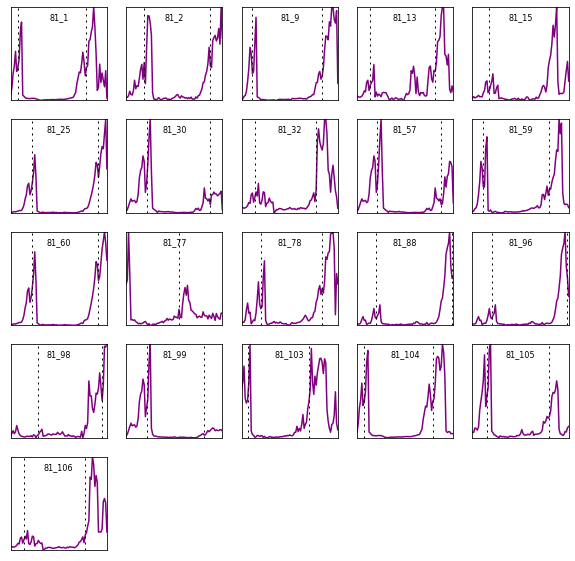

Showing plots for TE


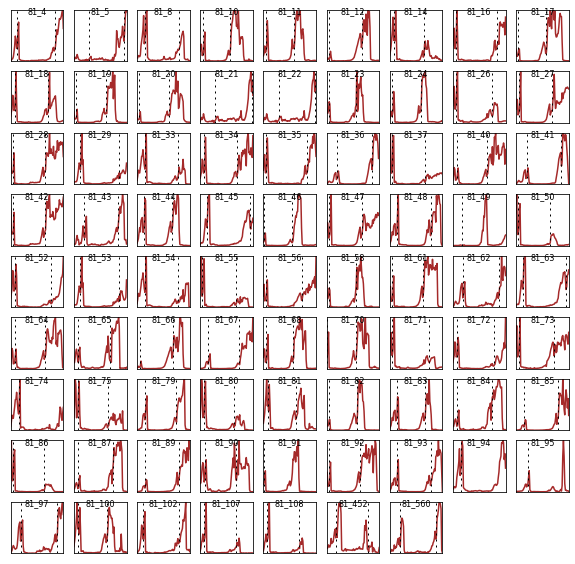

Showing plots for death
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


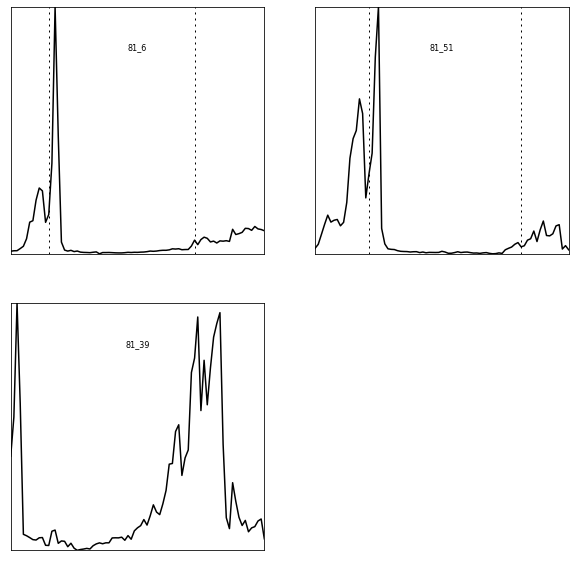

In [59]:
titles = True # add leaf cell IDs as plot titles
div_lines = True # add division lines (from lineage tree)
save_data = True # save computed traces for further analysis

if save_data:
    indiv_norm_traces = []

cnt = 0
for p in fate:
    plot_data = []
    if titles:
        names = []
    if div_lines:
        divisions = []
        
    for cell in fate_data[cnt][1]:
        frame = []
        fucci = []
        fucci_min = stack[2][2][1][1] + 1
        fucci_max = stack[2][2][0][1] - 1
        for f in cell[1]:
            frame.append(f[0])
            fucci.append(f[6])
            if f[6] > fucci_max:
                fucci_max = f[6]
            if f[6] < fucci_min:
                fucci_min = f[6]
                
        fucci_out = []
        for f in fucci:
            fucci_out.append((f - fucci_min)/(fucci_max - fucci_min + zero_division_epsilon))
            
        plot_data.append([frame, fucci_out])
        if titles:
            names.append(str(cell[0][0]) + '_' + str(cell[0][1]))
        if div_lines:
            divisions.append(cell[2])
    
    if save_data:
        tmp = []
        tmp.append(plot_data)
        if titles:
            tmp.append(names)
        if div_lines:
            tmp.append(divisions)
        indiv_norm_traces.append([fate[cnt], tmp])
    
    print('Showing plots for ' + fate[cnt])
    
    plt.figure(figsize=(10, 10))
    N, M = minimal_rectangle(len(plot_data))
    for i in range(len(plot_data)):
        plt.subplot(N, M, i + 1)
        plt.xticks([])
        plt.yticks([])
        if titles:
            plt.title(names[i], fontsize = 8, y = 0.8)
        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.plot(plot_data[i][0], smoothen_trace(plot_data[i][1], method = 'inverse', kernel_size = 0), c = colsel_by_fate(fate[cnt]))
        if div_lines:
            for division in divisions[i]:
                plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
            
    plt.show()
    cnt += 1

#### Plot <u>individually</u> min-max normalized FUCCI <u>derivative</u> traces 

Showing plots for ICM


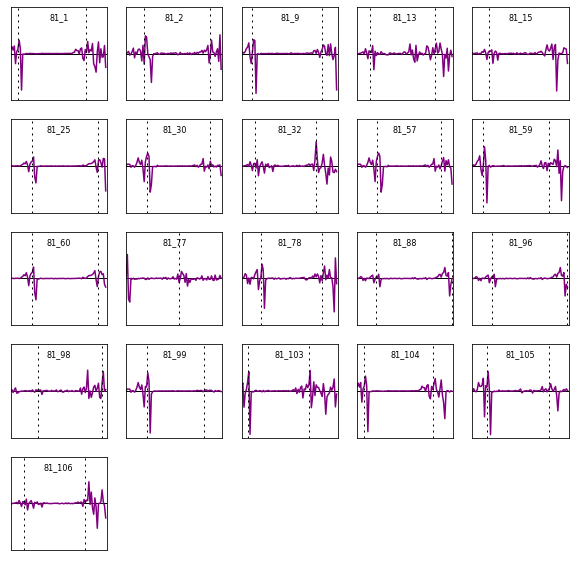

Showing plots for TE


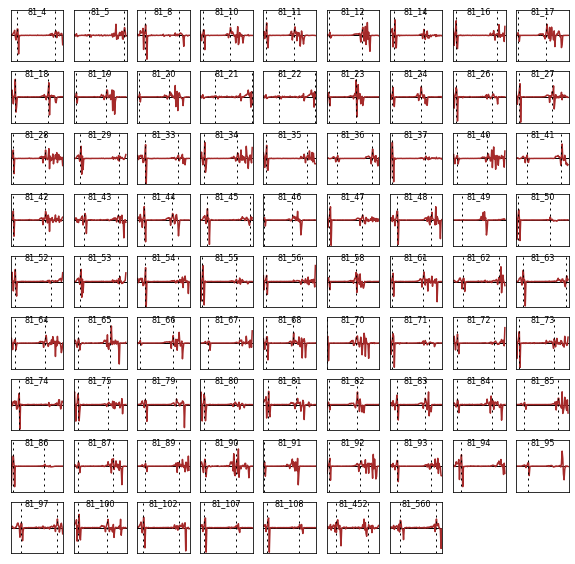

Showing plots for death
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


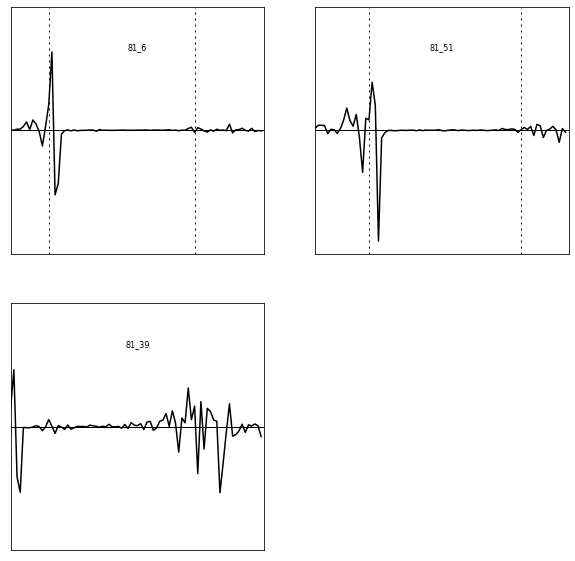

In [60]:
titles = True # add leaf cell IDs as plot titles
div_lines = True # add division lines (from lineage tree)
save_data = True # save computed traces for further analysis

if save_data:
    indiv_norm_derivs = []

cnt = 0
for p in fate:
    plot_data = []
    if titles:
        names = []
    if div_lines:
        divisions = []
        
    for cell in fate_data[cnt][1]:
        frame = []
        fucci = []
        fucci_min = stack[2][2][1][1] + 1
        fucci_max = stack[2][2][0][1] - 1
        for f in cell[1]:
            frame.append(f[0])
            fucci.append(f[6])
            if f[6] > fucci_max:
                fucci_max = f[6]
            if f[6] < fucci_min:
                fucci_min = f[6]
                
        fucci_der = []
        for i in range(len(fucci) - 1):
            temp1 = (fucci[i+1] - fucci_min)/(fucci_max - fucci_min + zero_division_epsilon)
            temp2 = (fucci[i] - fucci_min)/(fucci_max - fucci_min + zero_division_epsilon)
            fucci_der.append(temp1 - temp2)
        trash = frame.pop()
        
        plot_data.append([frame, fucci_der])
        if titles:
            names.append(str(cell[0][0]) + '_' + str(cell[0][1]))
        if div_lines:
            divisions.append(cell[2])
    
    if save_data:
        tmp = []
        tmp.append(plot_data)
        if titles:
            tmp.append(names)
        if div_lines:
            tmp.append(divisions)
        indiv_norm_derivs.append([fate[cnt], tmp])
    
    print('Showing plots for ' + fate[cnt])
    
    plt.figure(figsize=(10, 10))
    N, M = minimal_rectangle(len(plot_data))
    for i in range(len(plot_data)):
        plt.subplot(N, M, i + 1)
        plt.xticks([])
        plt.yticks([])
        if titles:
            plt.title(names[i], fontsize = 8, y = 0.8)
        plt.ylim(-1, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.plot(plot_data[i][0], smoothen_trace(plot_data[i][1], method = 'inverse', kernel_size = 0), c = colsel_by_fate(fate[cnt]))
        if div_lines:
            for division in divisions[i]:
                plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        
    plt.show()
    cnt += 1

In [26]:
# print fate name
print(indiv_norm_traces[0][0])
# print first cell's frames
print(indiv_norm_traces[0][1][0][0][0])
# print first cell's individually normalized fucci intensities
print(indiv_norm_traces[0][1][0][0][1])
# print leaf cell names
print(indiv_norm_traces[0][1][1])
# print cell divisions
print(indiv_norm_traces[0][1][2])

ICM
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]
[0.025840474654002195, 0.012301207310272622, 0.020207145288648483, 0.0257579907817533, 0.01318719470044796, 0.0007238097624829207, 0.00911562903976798, 0.01490193031808492, 0.01469977215438269, 0.03227685644055409, 0.0008423813730446976, 0.013570927651183824, 0.00756156739405941, 0.013556258653850246, 0.014709629453275181, 0.01680450595510246, 0.01406953990221958, 0.0136403464255795, 0.006925136738695163, 0.00699405429450204, 0.014454642850430232, 0.013134533334167382, 0.010804785802147854, 0.016623566044946865, 0.011151328333676899, 0.00037588052619619847, 0.0023908126632867384, 0.0035125398625403133, 0.0, 0.006016076586199614, 0.022915663707388286, 0.01954689004308201, 0.005440577403810967, 0.01722509517932086, 0.010209271290825215, 0.0

#### Plot a given cell's FUCCI trace along the derivative trace

In [61]:
def plot_cell_double_trace(trace1, trace2, cell_ID, smoothing = ['inverse', 0]): # plots individually normalized trace and the derivative trace of quiried cell
    fate_index = -1
    cell_index = -1
    cell_name = str(cell_ID[0]) + '_' + str(cell_ID[1])
    
    cnt = 0
    for fates in trace1:
        if cell_name in fates[1][1]:
            fate_index = cnt
            cell_index = fates[1][1].index(cell_name)
        cnt += 1
    
    plt.figure(figsize=(10, 10))
    
    plt.subplot(2, 1, 1)
    plt.plot(trace1[fate_index][1][0][cell_index][0], smoothen_trace(trace1[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1]), c = colsel_by_fate(fate[fate_index]), linewidth = 3)
    for division in trace1[fate_index][1][2][cell_index]:
        plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
    plt.ylim(0, 1)
    plt.xlim(stack[2][1][0], stack[2][1][1])
    plt.ylabel('Individually Min-MAx Normallized FUCCI')
    
    plt.subplot(2, 1, 2)
    plt.plot(trace2[fate_index][1][0][cell_index][0], smoothen_trace(trace2[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1]), c = colsel_by_fate(fate[fate_index]), linewidth = 3)
    for division in trace2[fate_index][1][2][cell_index]:
        plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
    plt.axhline(y = 0, color = 'k', linewidth = 1)
    plt.ylim(-1, 1)
    plt.xlim(stack[2][1][0], stack[2][1][1])
    plt.ylabel('Individually Min-MAx Normallized FUCCI Derivative')
    plt.xlabel('Frame')
    plt.title('Cell ' + cell_name + ' (' + fate[fate_index] + ')', fontsize = 15, y = 1.025)
    
    plt.show()

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


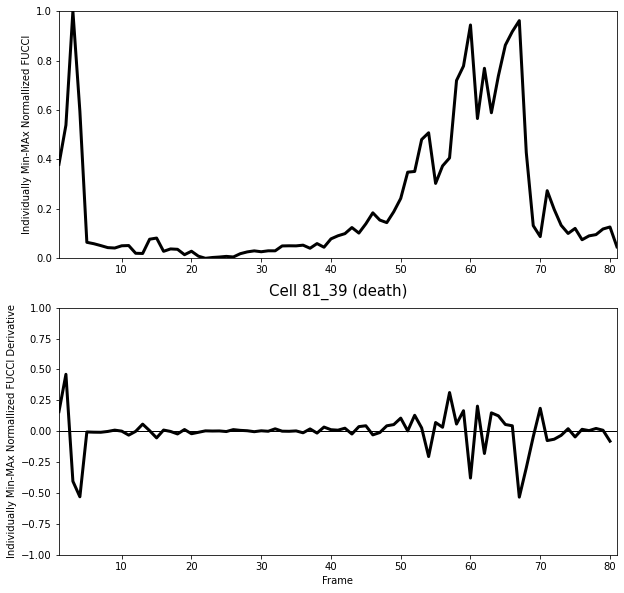

In [62]:
target_cell_ID = [81, 39] # desired cell's [frame, ID]
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID)

#### Inverse kernel smoothing

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


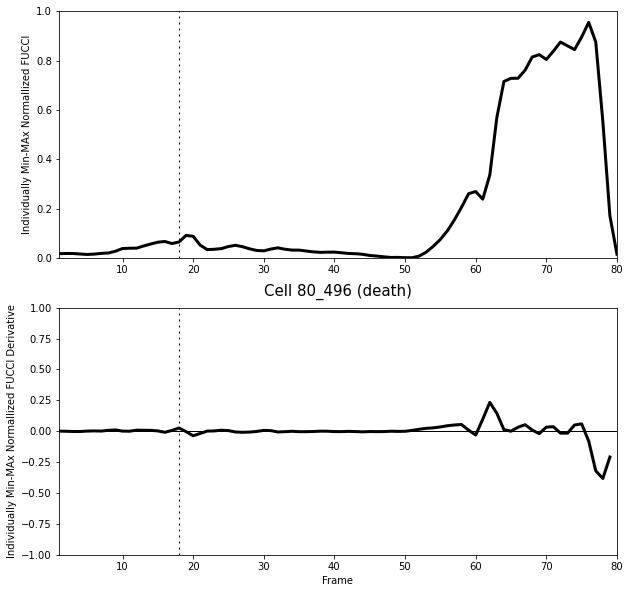

In [56]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['inverse', 1])

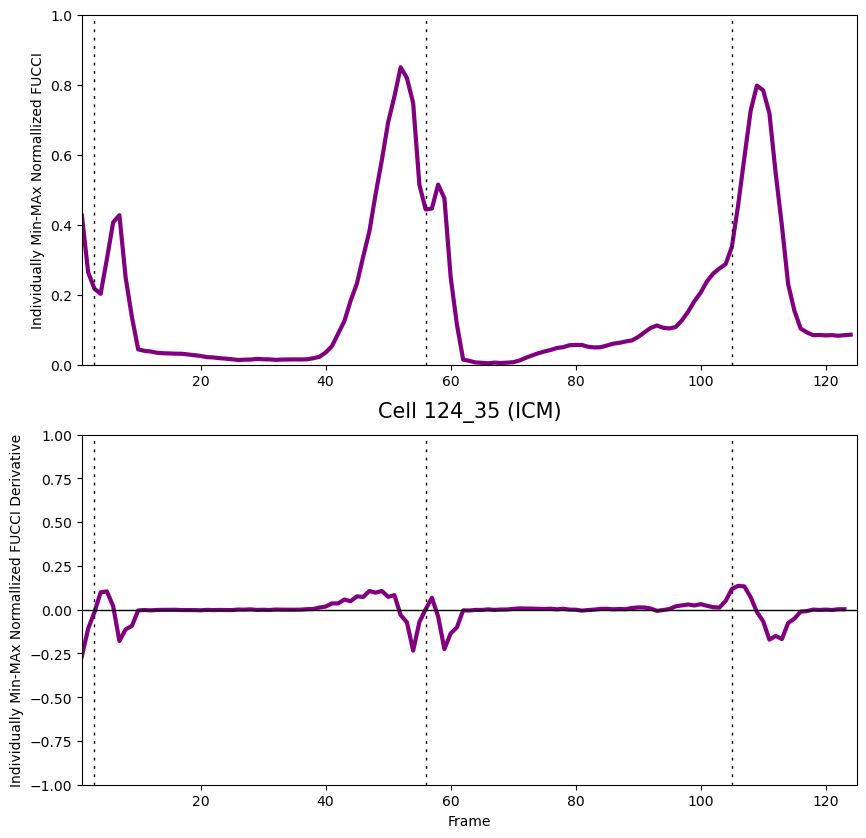

In [37]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['inverse', 2])

#### Averaging kernel smoothing

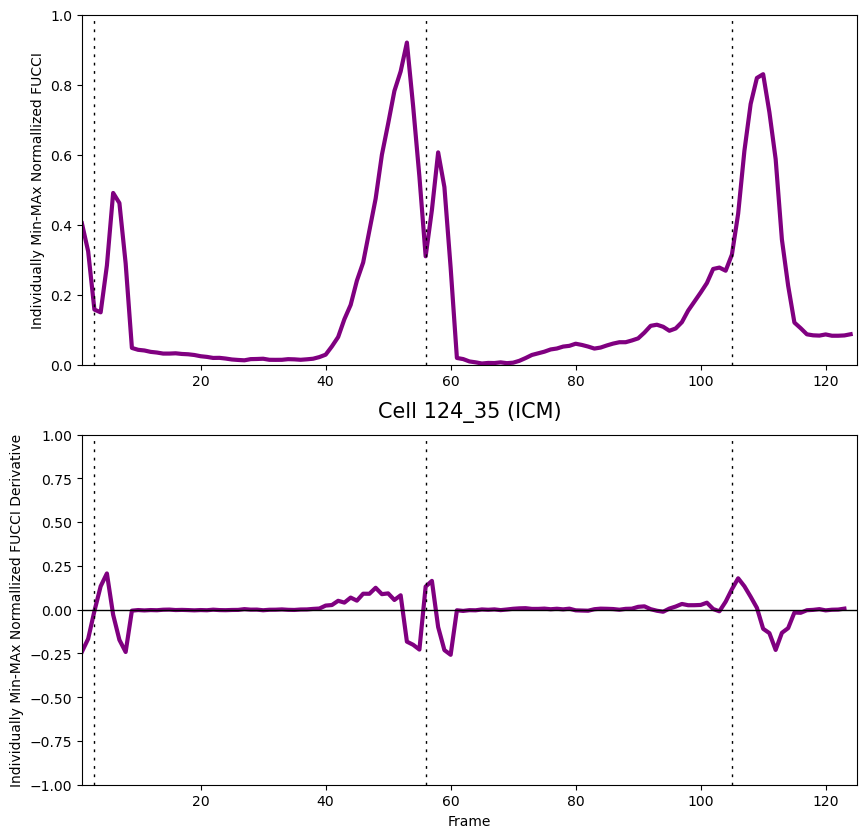

In [38]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['average', 1])

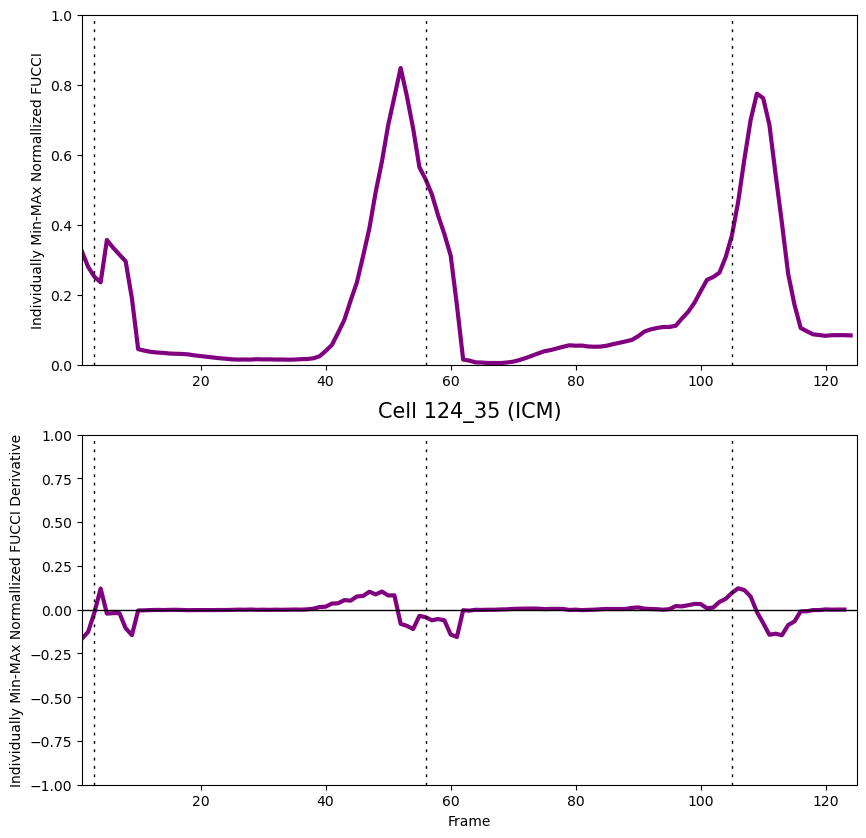

In [39]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['average', 2])

In [50]:
print(indiv_norm_derivs[0][1][0][0])

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123], [-0.48165293860912817, 0.00017970880253048716, -0.017619800784039602, -0.006376941244632617, 0.425509211427488, 0.20276991360225716, -0.7150608789941132, -0.004662091663923257, -0.004997205982638281, -0.006403407316798539, 0.005658197346348551, -0.01110090291527684, -0.00036661856534293477, 0.0025306611392849065, -0.002100768535652789, 0.0019588866501229346, -0.005529705537571775, 0.0008534199275482407, -0.0015845888211599816, -0.00975467305112769, 0.005685710851374887, -0.004951027119

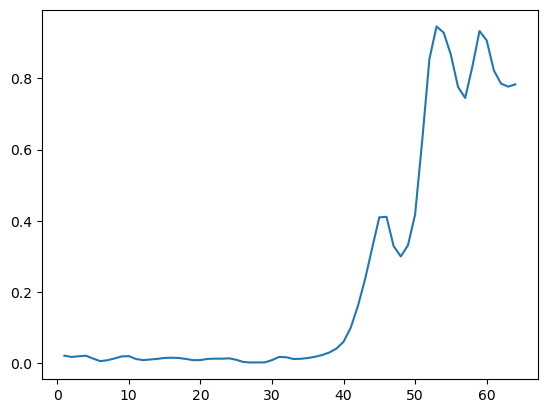

In [26]:
test_trace = indiv_norm_traces[0][1][0][0]
test_smooth_trace = smoothen_trace(test_trace[1], method='inverse', kernel_size=1)
plt.plot(test_trace[0], test_smooth_trace)

In [31]:
print(indiv_norm_traces[0][1][2][0])

[[43, 9], [92, 12]]


In [28]:
# save out all derivative measurements
all_derivs = []
for indiv_fate in indiv_norm_derivs:
    for cell in indiv_fate[1][0]:
        for point in cell[1]:
            all_derivs.append(point)

Text(0, 0.5, 'Occurances')

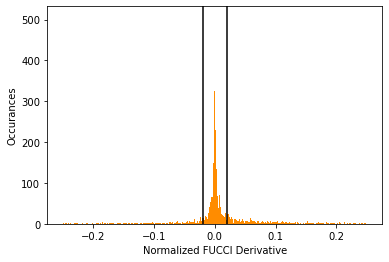

In [29]:
plt.hist(all_derivs, bins=1000, range=(-0.25, 0.25), color='darkorange')
plt.axvline(x = -1 * deriv_thresh, c = 'black')
plt.axvline(x = deriv_thresh, c = 'black')
plt.xlabel('Normalized FUCCI Derivative')
plt.ylabel('Occurances')

In [30]:
def annotate_division(raw_traces, deriv_traces, cell_ID, division_round = 64, smoothing = ['inverse', 1], makeplots = False, savefig = [False, 'null']):
    # find and format data of the queried cell
    fate_index = -1
    cell_index = -1
    cell_name = str(cell_ID[0]) + '_' + str(cell_ID[1])
    
    cnt = 0
    for fates in raw_traces:
        if cell_name in fates[1][1]:
            fate_index = cnt
            cell_index = fates[1][1].index(cell_name)
        cnt += 1
    
    temp_frames = raw_traces[fate_index][1][0][cell_index][0]
    temp_smooth = smoothen_trace(raw_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_derivs = smoothen_trace(deriv_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_divs = raw_traces[fate_index][1][2][cell_index]
    
    # annotate trace features
    if division_round == 128:
        division_index = 1
    elif division_round == 64:
        division_index = 0
    else:
        print('ERROR: Non-valid division request')
        return [-1, -1, -1, -1]
    
    if len(temp_divs) == 0:
        print('ERROR: No divisions in requested trace')
        return [-1, -1, -1, -1]
    
    if (division_index + 1) > len(temp_divs):
        print('ERROR: Requested division does not occur in requested trace')
        return [-1, -1, -1, -1]
    
    div_frame = temp_divs[division_index][0]
    div_frame_index = temp_frames.index(div_frame)
    
    permit = 25
    pre_div_peak = [-1, -999]
    pre_div_dip = [-1, 999]
    for i in range(max(div_frame_index - permit, 0), div_frame_index - 1, 1):
        if temp_smooth[i] > pre_div_peak[1]:
            pre_div_peak[0] = i
            pre_div_peak[1] = temp_smooth[i]
        if temp_derivs[i] < pre_div_dip[1]:
            pre_div_dip[0] = i
            pre_div_dip[1] = temp_derivs[i]
    
    post_div_peak = [-1, -999]
    post_div_dip = [-1, 999]
    for i in range(div_frame_index + 1, min(div_frame_index + permit, len(temp_frames) - 1), 1):
        if temp_smooth[i] > post_div_peak[1]:
            post_div_peak[0] = i
            post_div_peak[1] = temp_smooth[i]
        if temp_derivs[i] < post_div_dip[1]:
            post_div_dip[0] = i
            post_div_dip[1] = temp_derivs[i]
    
    mitotic_dip = [-1, 999]
    for i in range(pre_div_peak[0], post_div_peak[0], 1):
        if temp_smooth[i] < mitotic_dip[1]:
            mitotic_dip[0] = i
            mitotic_dip[1] = temp_smooth[i]
    
    pre_div_thresh = [-1, False]
    i = max(div_frame_index - permit, 0)
    while not pre_div_thresh[1] and i < div_frame_index:
        if temp_derivs[i] >= deriv_thresh:
            pre_div_thresh[1] = True
            pre_div_thresh[0] = i
        i += 1
    
    post_div_thresh = [-1, False]
    i =  post_div_dip[0]
    while not post_div_thresh[1] and i < min(div_frame_index + permit, len(temp_derivs) - 1):
        if temp_derivs[i] >= -1 * deriv_thresh:
            post_div_thresh[1] = True
            post_div_thresh[0] = i
        i += 1
    
    # make annotated plots
    if makeplots:
        plt.figure(figsize=(10, 10))

        plt.subplot(2, 1, 1)
        plt.plot(temp_frames, temp_smooth, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        # draw tree-based division lines
        for division in temp_divs:
            plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        # draw annotated events
        plt.axvline(x = temp_frames[pre_div_peak[0]], c = 'green')
        #plt.axvline(x = temp_frames[pre_div_dip[0] + 1], c = 'red') 
        plt.axvline(x = temp_frames[post_div_peak[0]], c = 'green') 
        #plt.axvline(x = temp_frames[post_div_dip[0] + 1], c = 'red') 
        if pre_div_thresh[1]:
            plt.axvline(x = temp_frames[pre_div_thresh[0]], c = 'blue')
        if post_div_thresh[1]:
            plt.axvline(x = temp_frames[post_div_thresh[0]], c = 'blue')
        plt.axvline(x = temp_frames[mitotic_dip[0]], c = 'yellow')

        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI')

        plt.subplot(2, 1, 2)
        plt.plot(deriv_traces[fate_index][1][0][cell_index][0], temp_derivs, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        # draw tree-based division lines
        for division in temp_divs:
            plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        # draw annotated events
        #plt.axvline(x = temp_frames[pre_div_peak[0] - 1], c = 'green')
        plt.axvline(x = temp_frames[pre_div_dip[0]], c = 'red') 
        #plt.axvline(x = temp_frames[post_div_peak[0] - 1], c = 'green') 
        plt.axvline(x = temp_frames[post_div_dip[0]], c = 'red')
        if pre_div_thresh[1]:
            plt.axvline(x = temp_frames[pre_div_thresh[0]], c = 'blue')
        if post_div_thresh[1]:
            plt.axvline(x = temp_frames[post_div_thresh[0]], c = 'blue')

        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.axhline(y = deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = -1 * deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.ylim(-1, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI Derivative')
        plt.xlabel('Frame')
        plt.title('Cell ' + cell_name + ' (' + fate[fate_index] + ')', fontsize = 15, y = 1.025)

        # save out the plots
        if savefig[0]:
            temp_name = fate[fate_index] + '_' + cell_name + '_labeled_' + str(division_round) + '.png'
            plt.savefig(os.path.join(savefig[1], temp_name))

        plt.show()
    
    return [div_frame, temp_frames[pre_div_thresh[0]], temp_frames[mitotic_dip[0]], temp_frames[post_div_thresh[0]]]

In [31]:
test_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, [81, 32])

In [32]:
print(fate)

['ICM', 'TE', 'death']


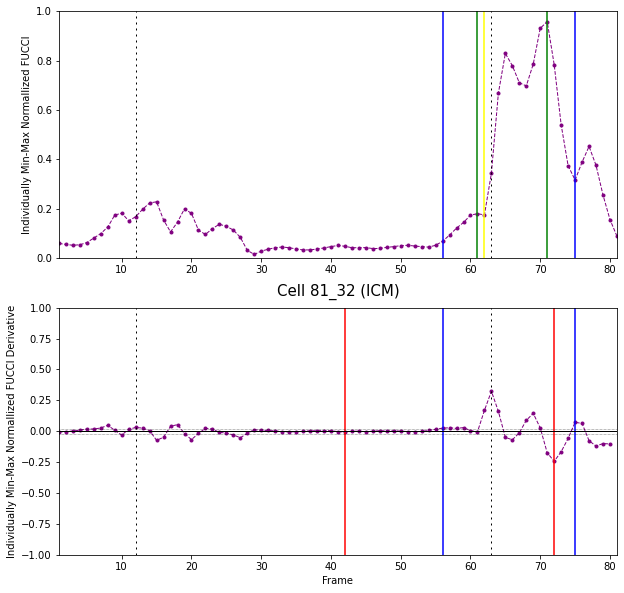

In [33]:
test_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, [81, 32], division_round = 128, makeplots = True, savefig = [False, plot_path])

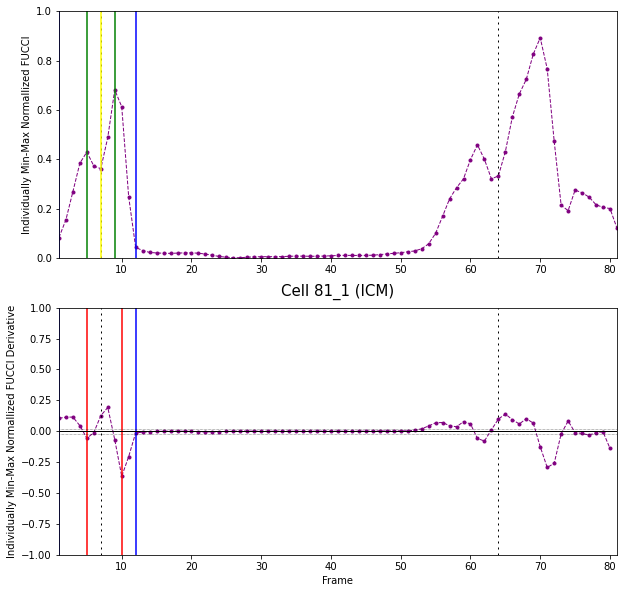

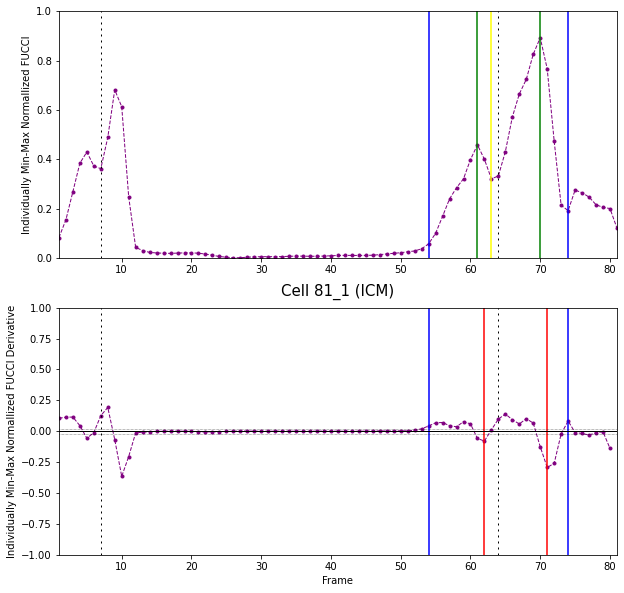

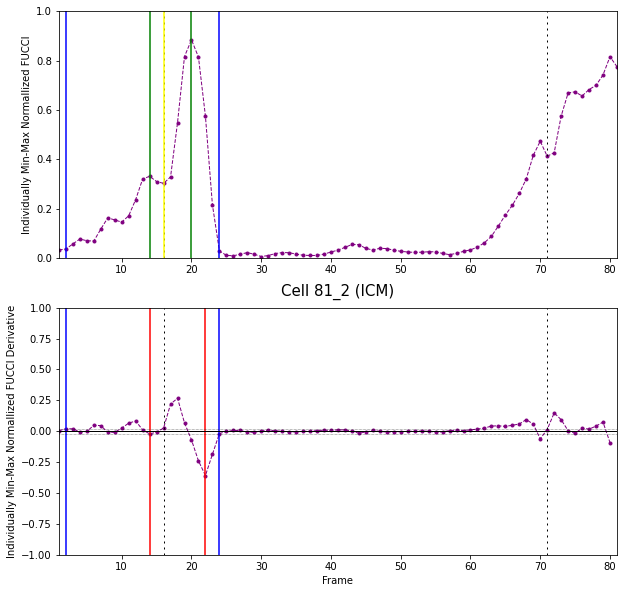

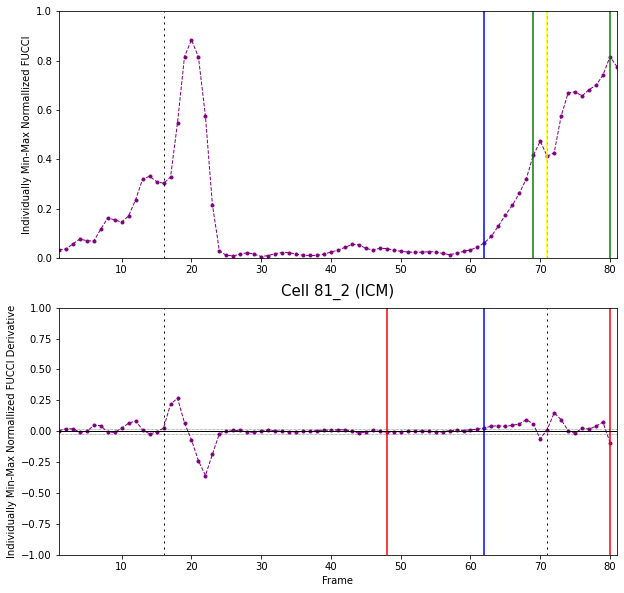

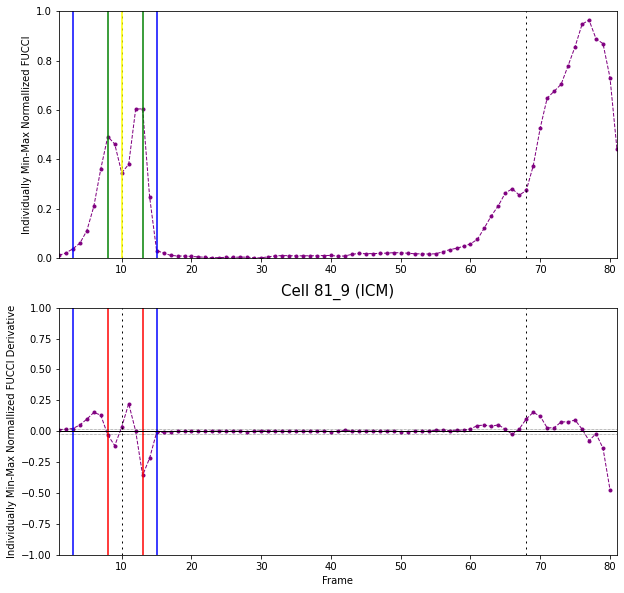

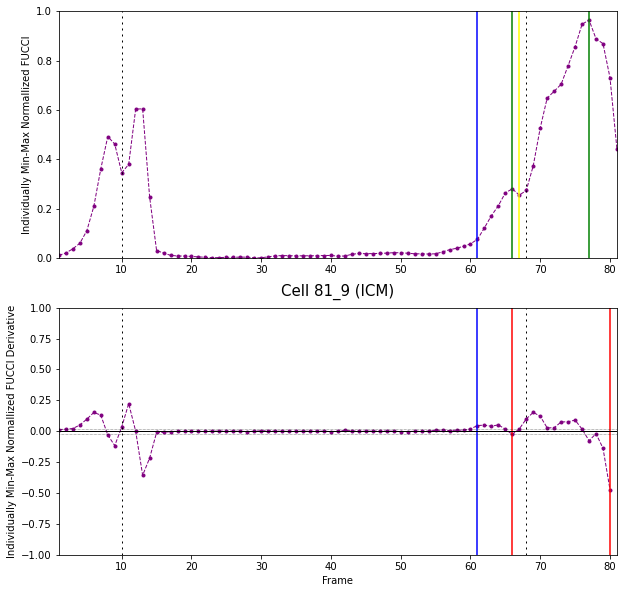

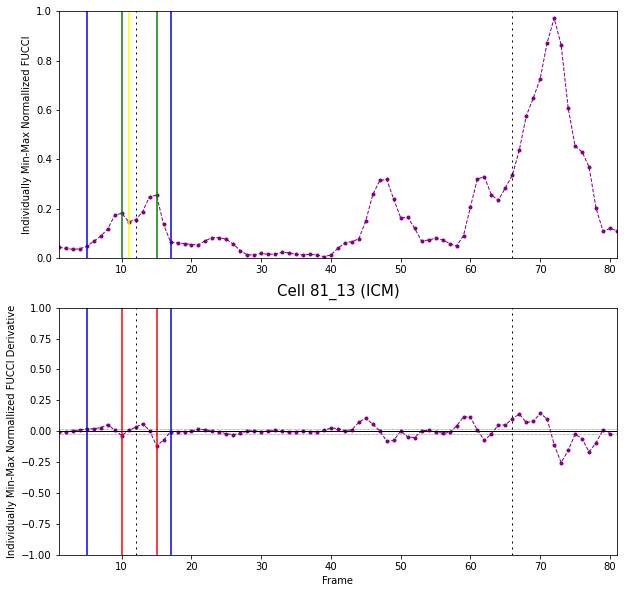

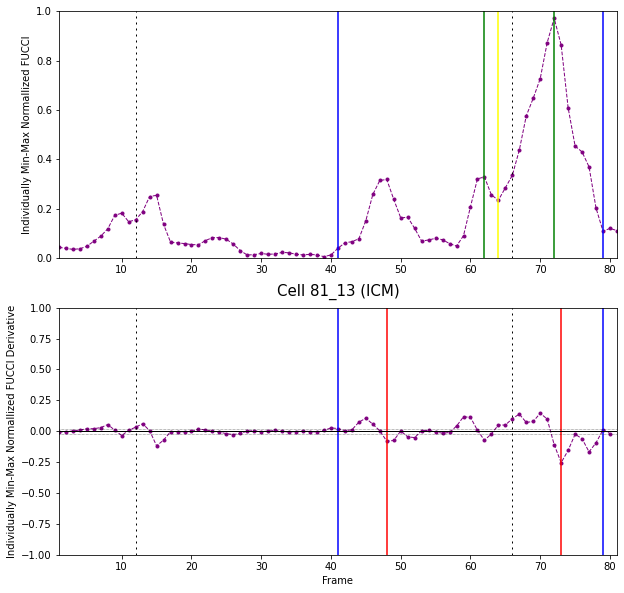

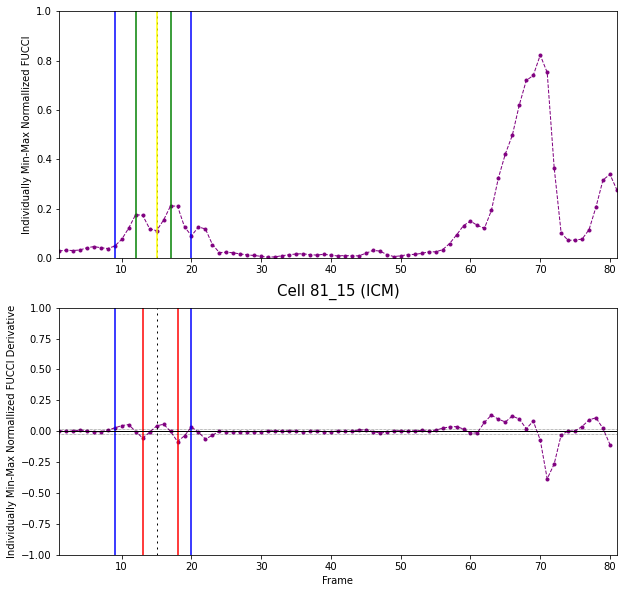

ERROR: Requested division does not occur in requested trace


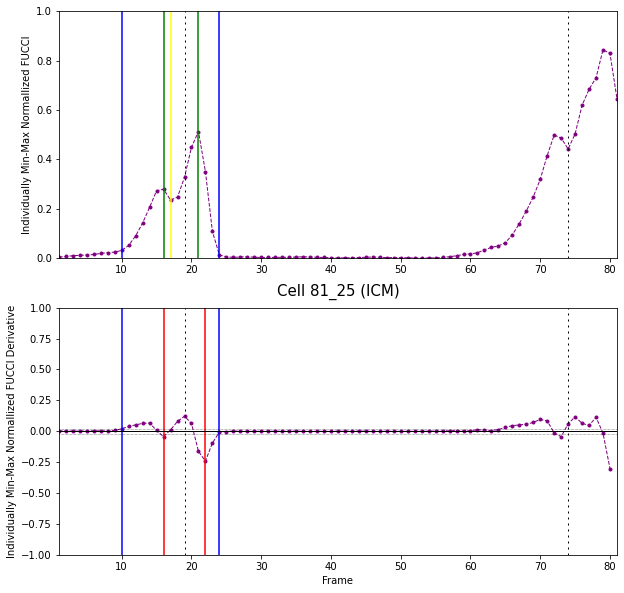

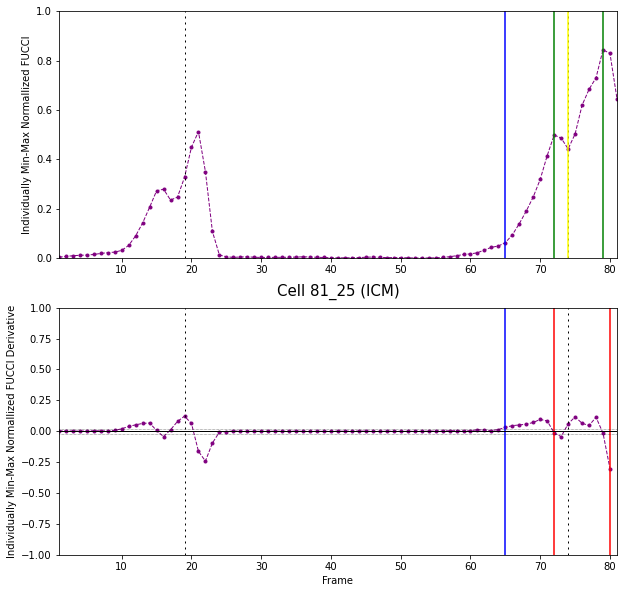

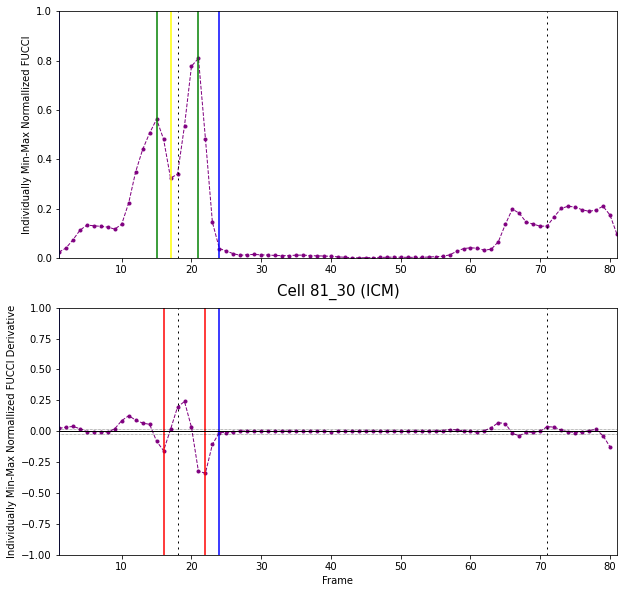

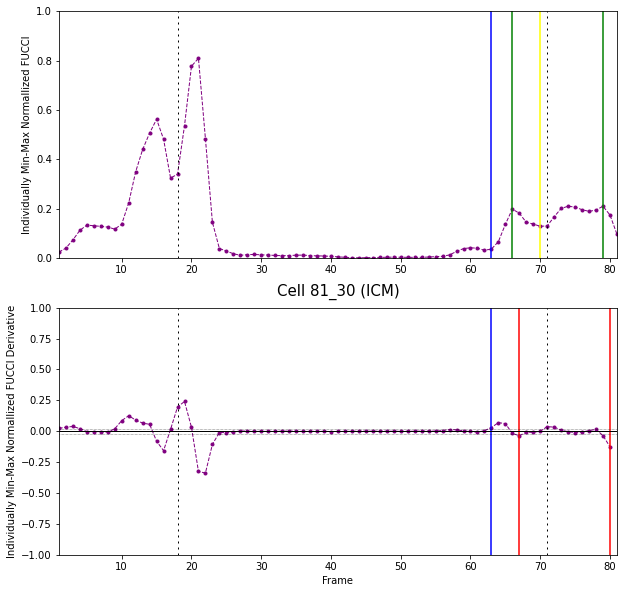

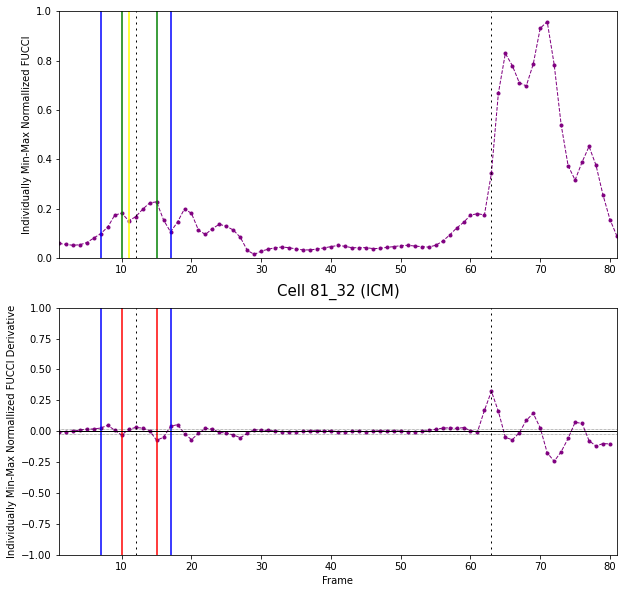

...

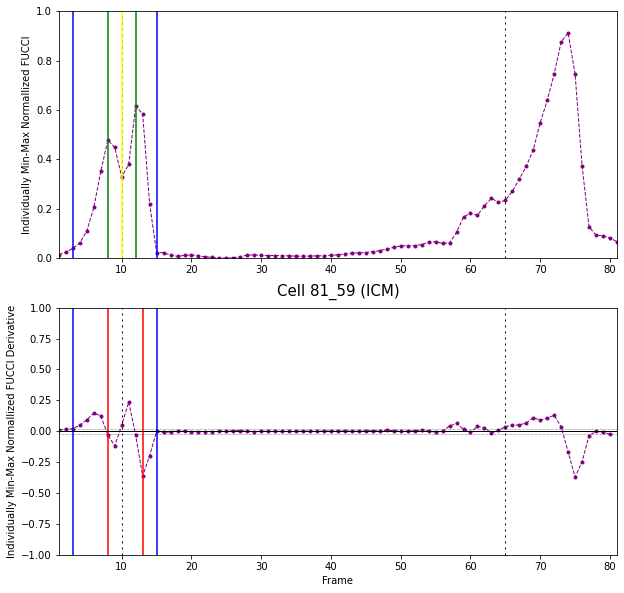

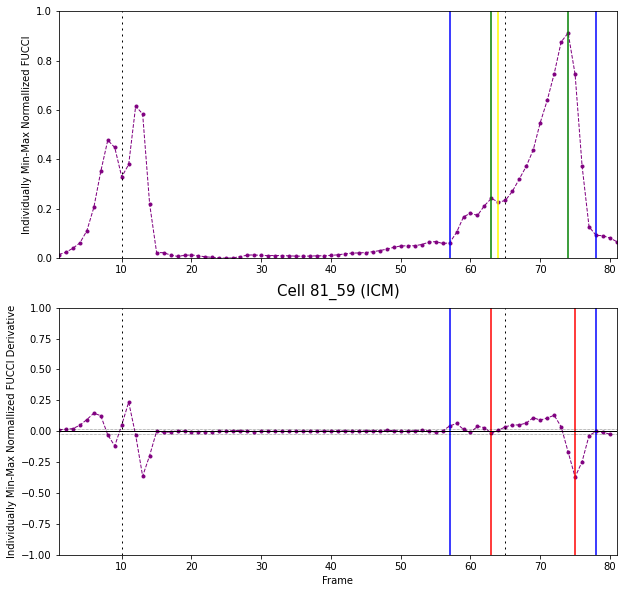

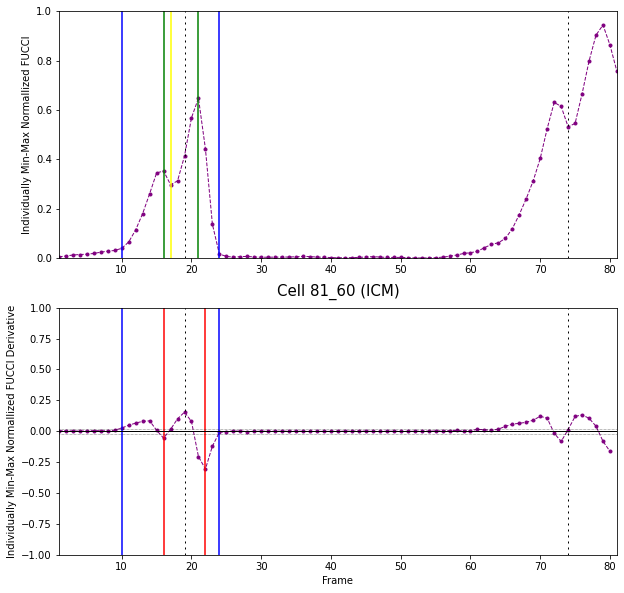

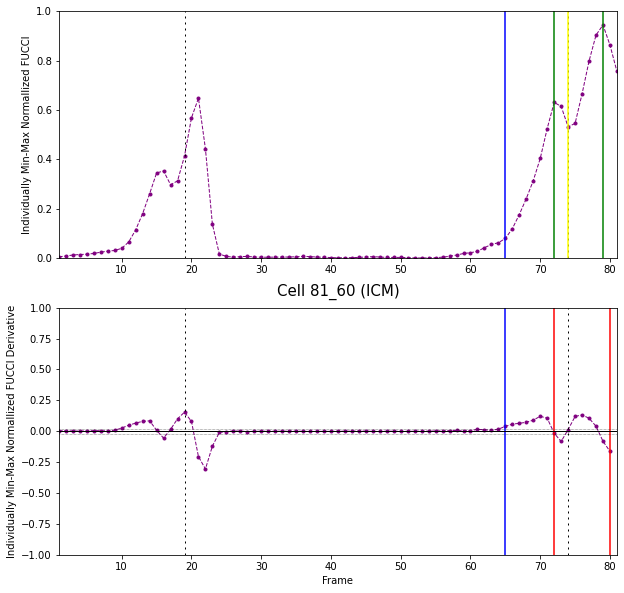

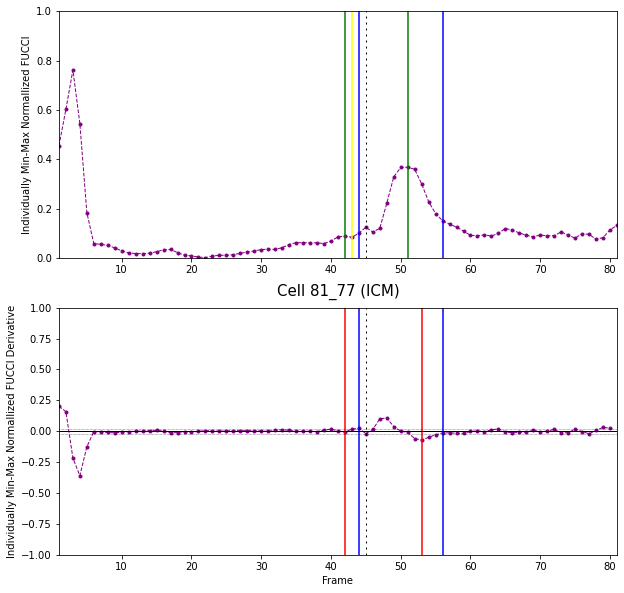

ERROR: Requested division does not occur in requested trace


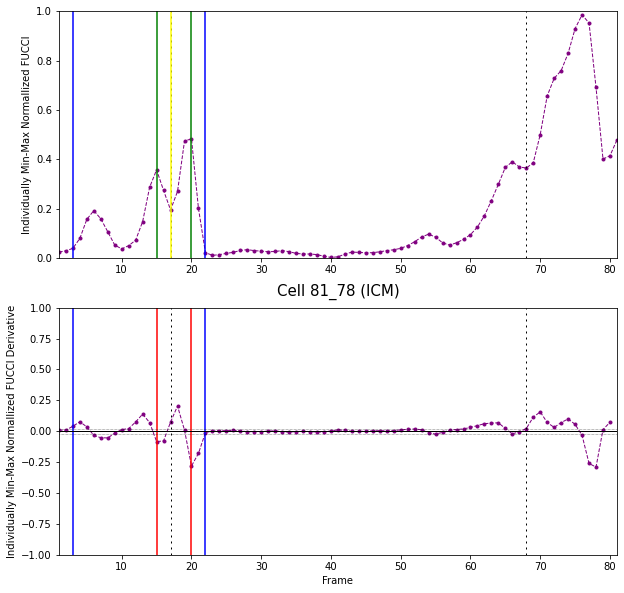

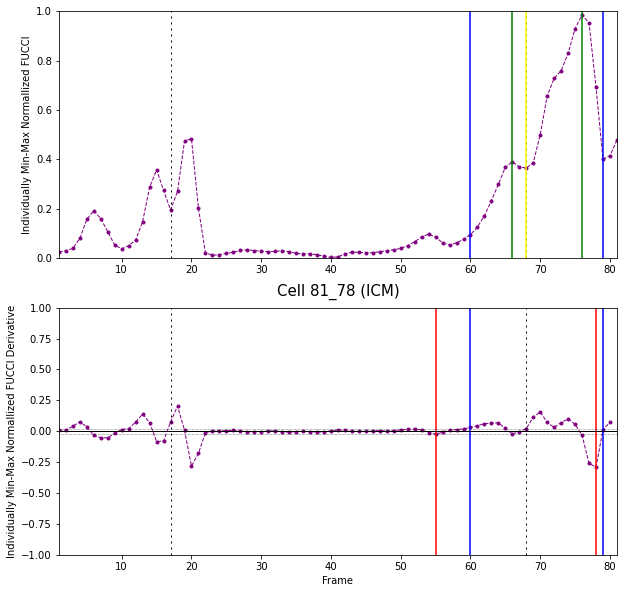

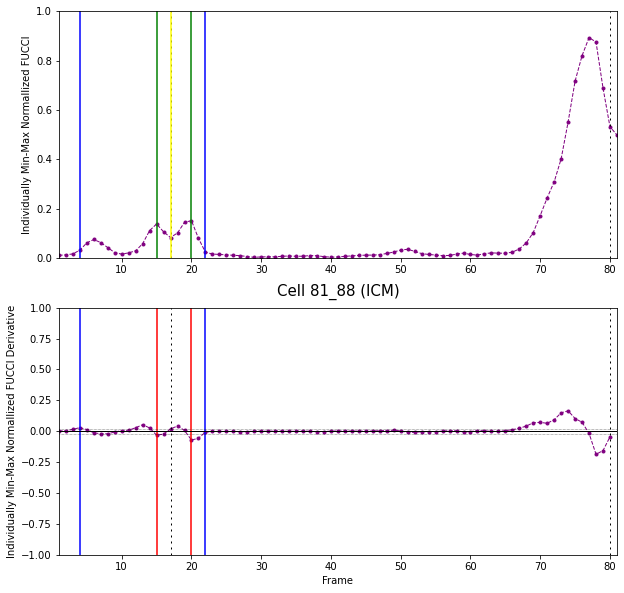

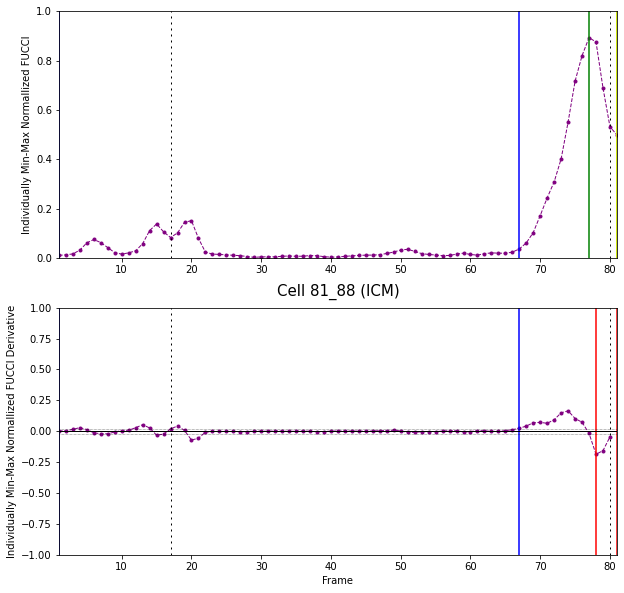

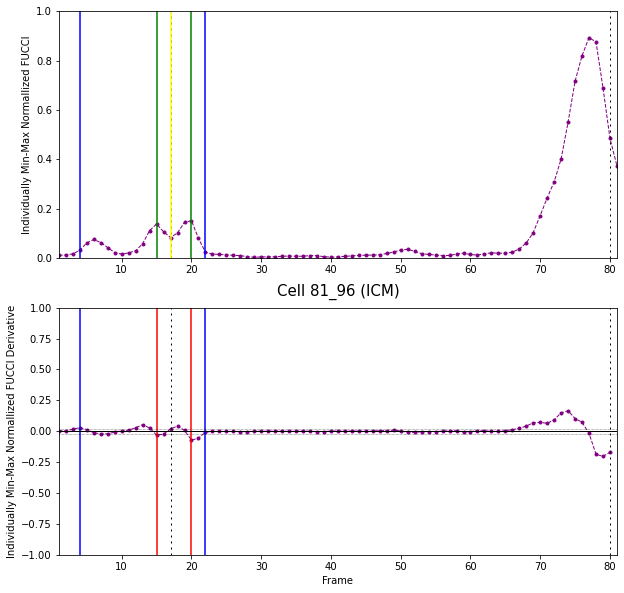

...

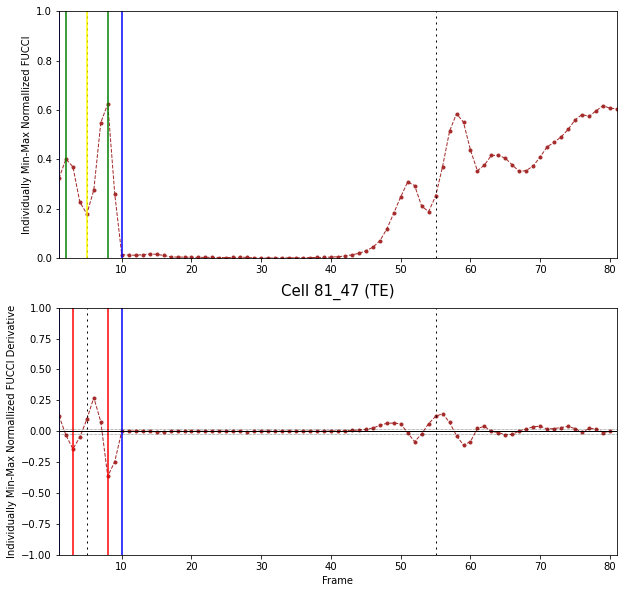

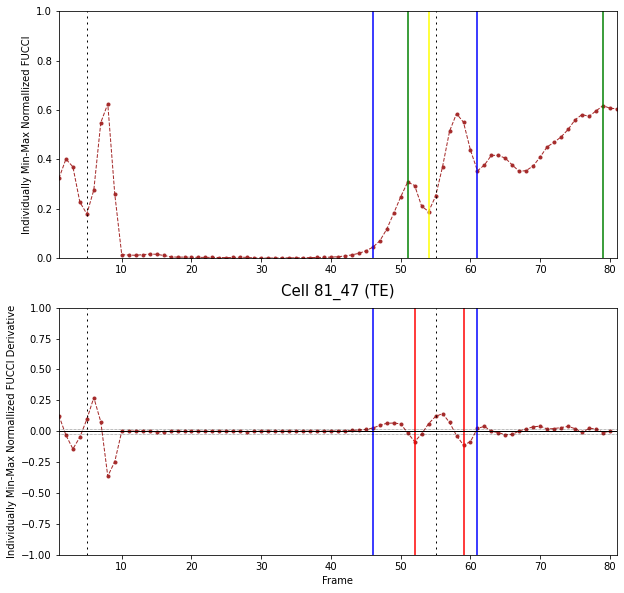

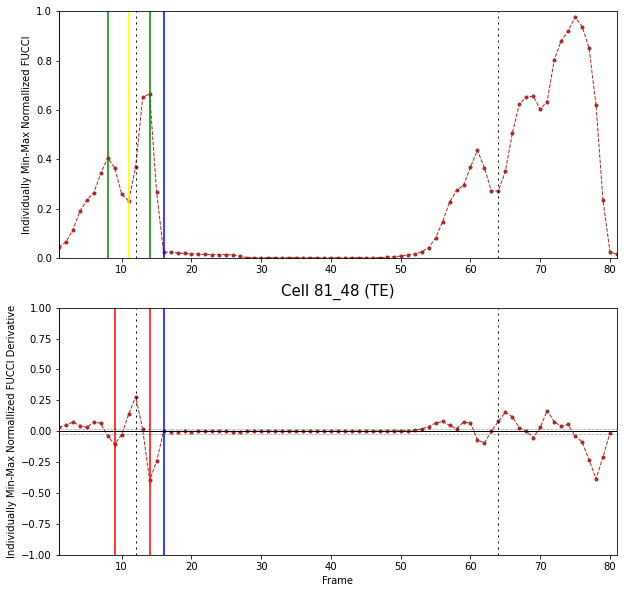

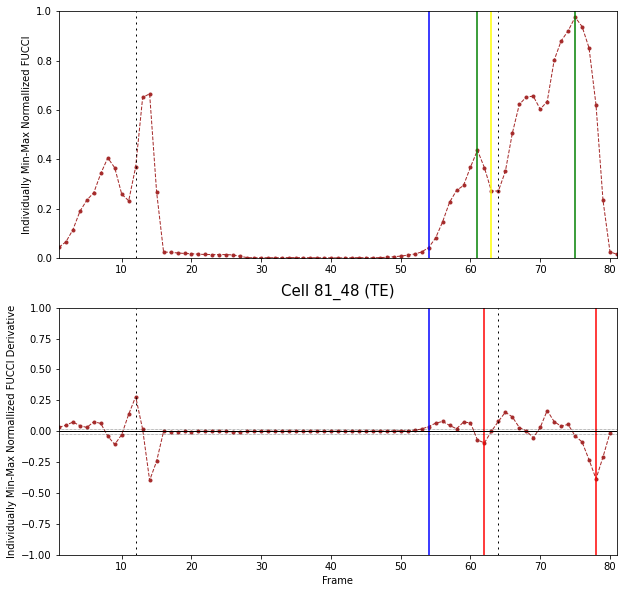

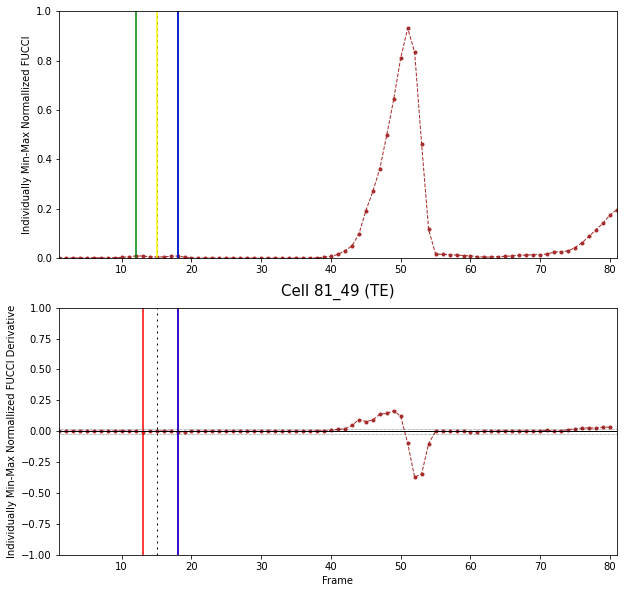

ERROR: Requested division does not occur in requested trace


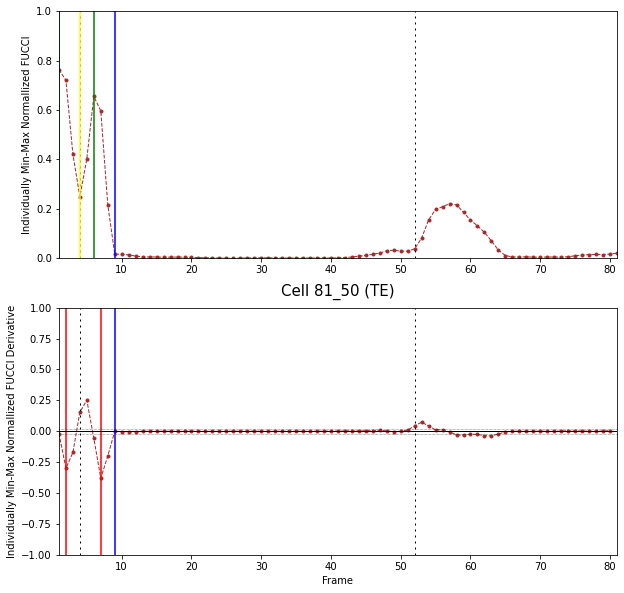

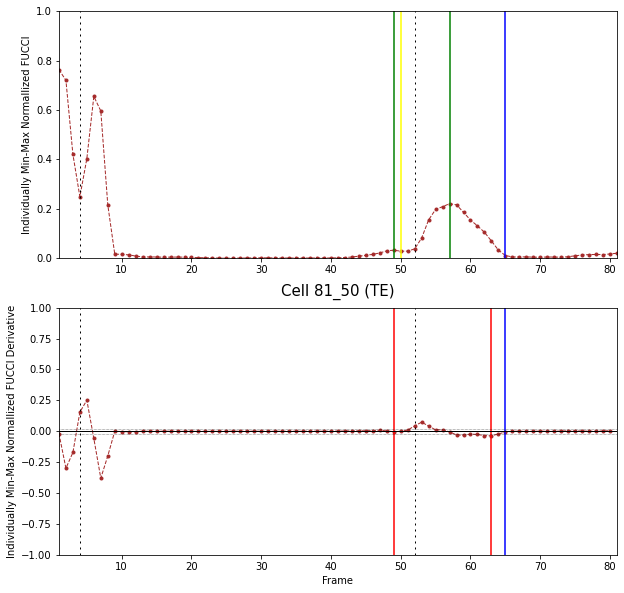

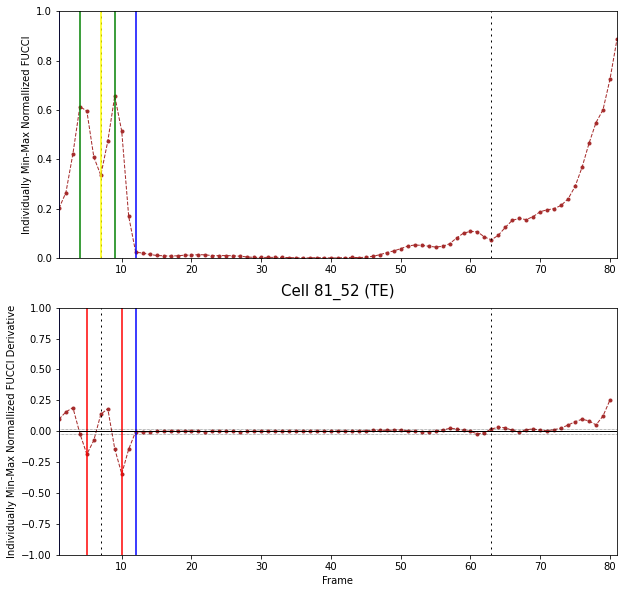

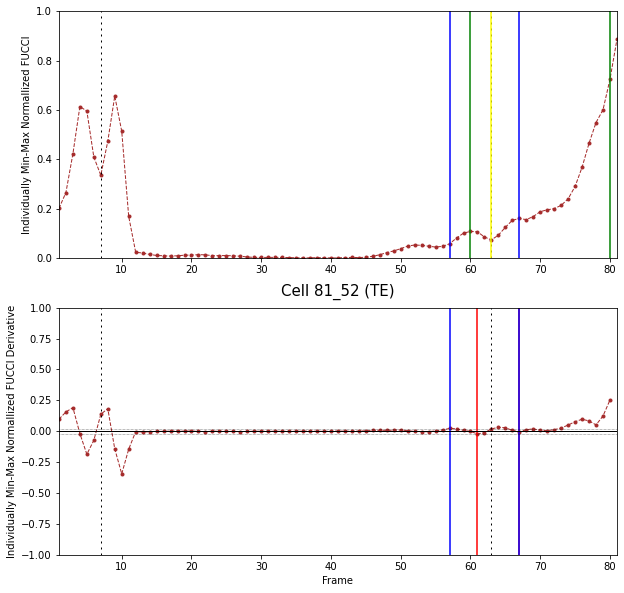

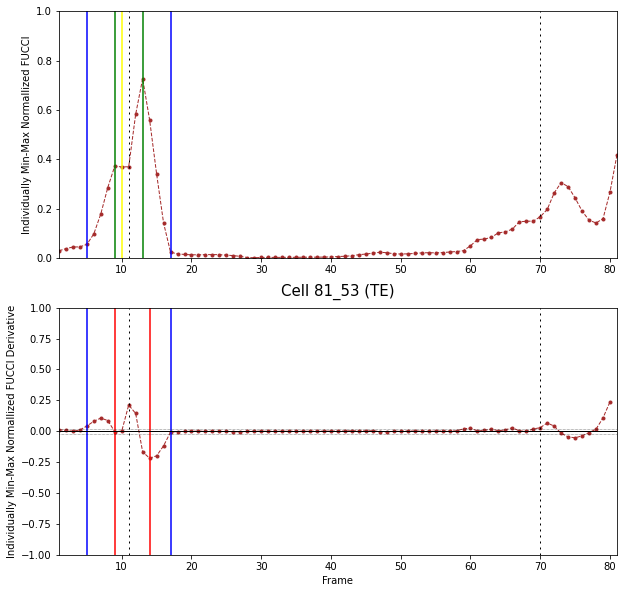

...

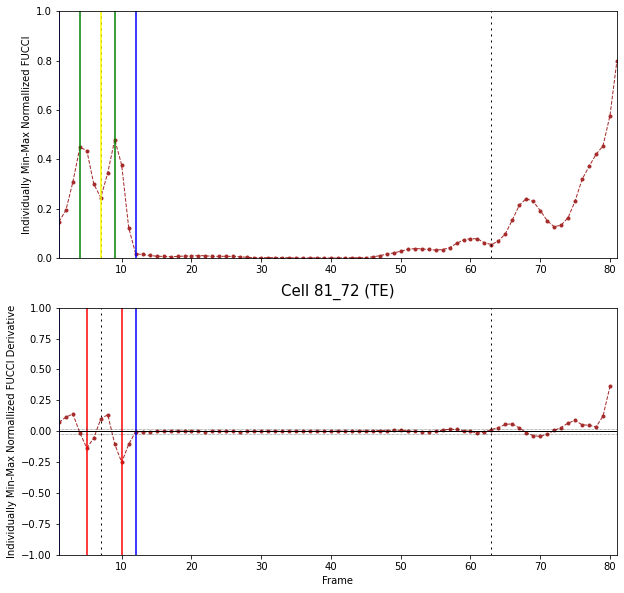

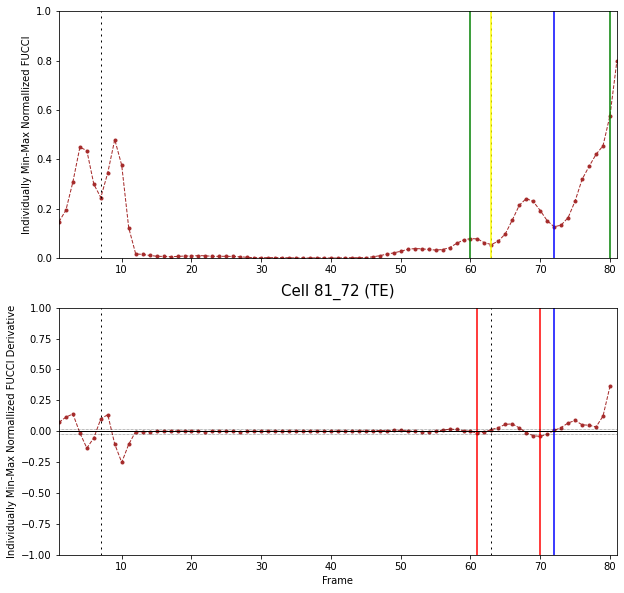

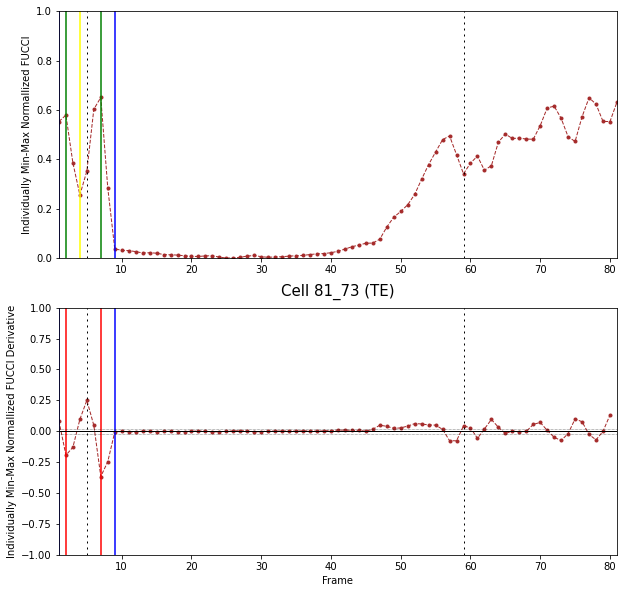

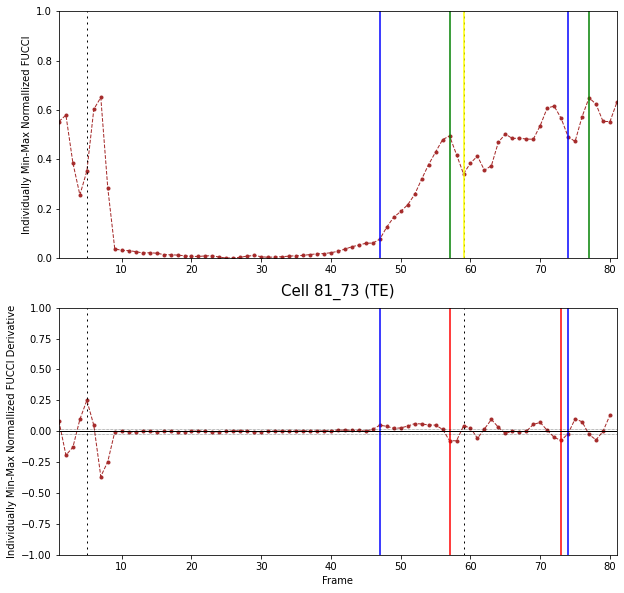

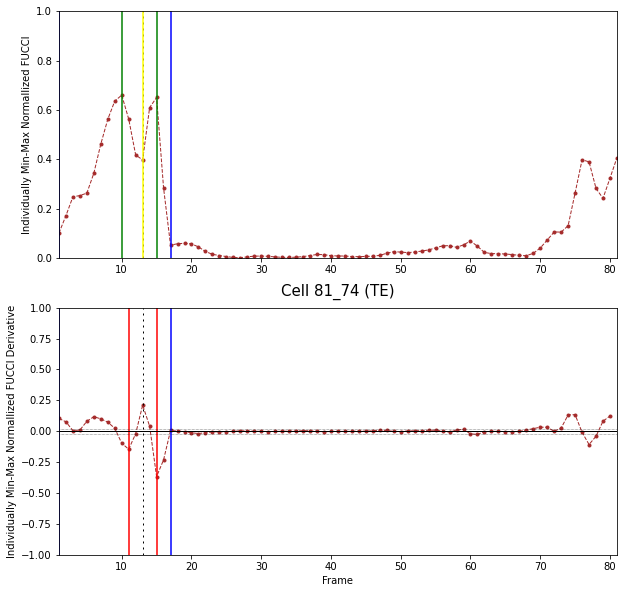

ERROR: Requested division does not occur in requested trace


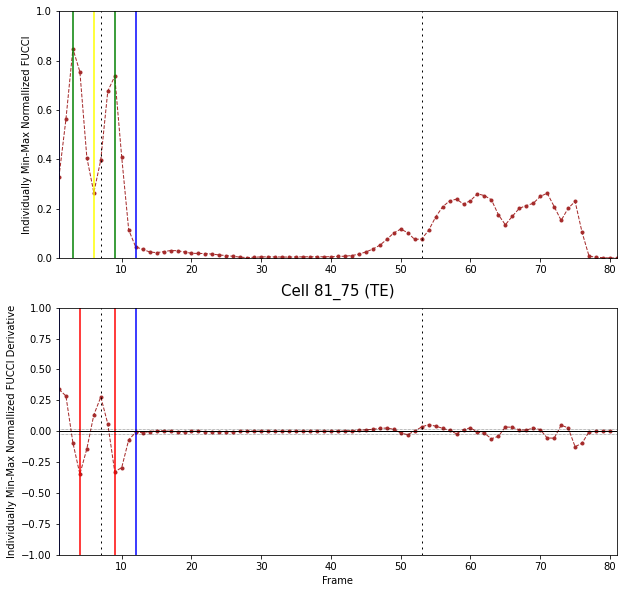

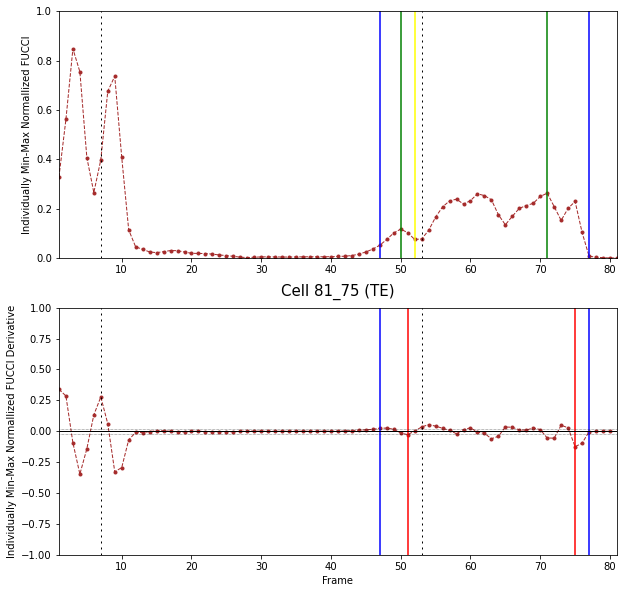

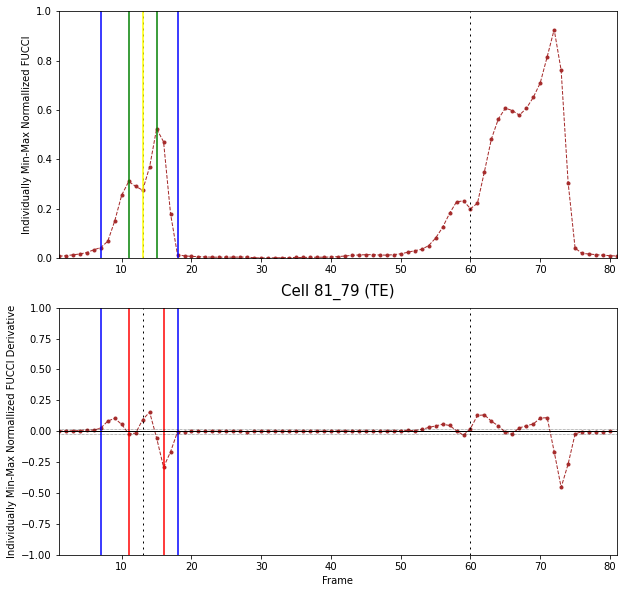

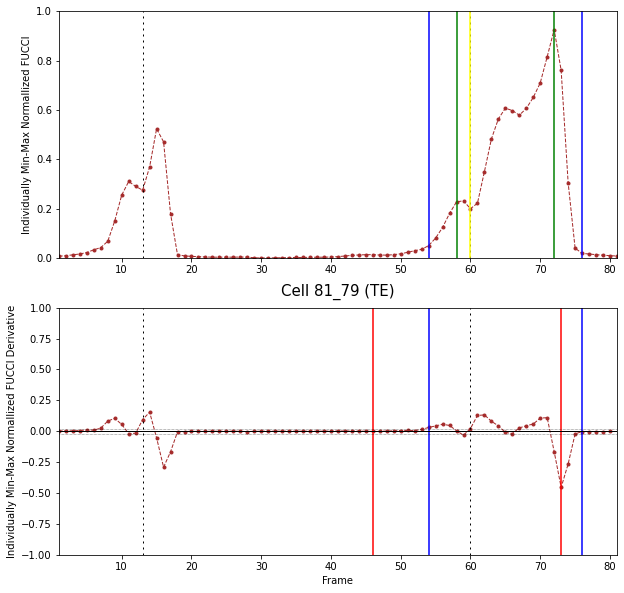

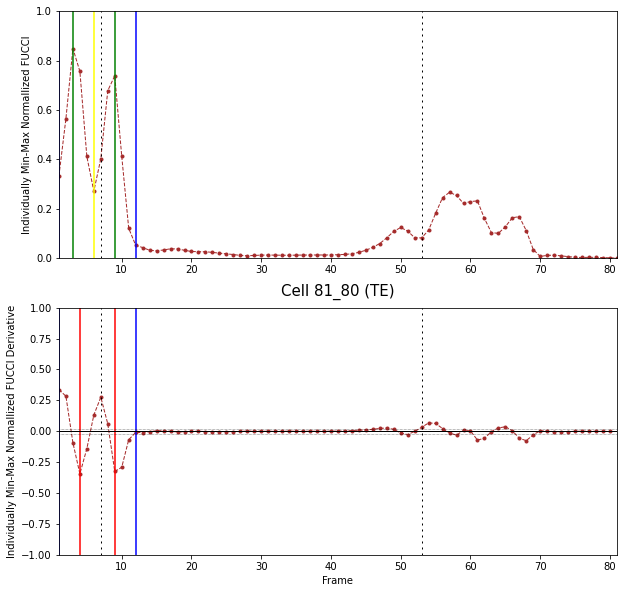

...

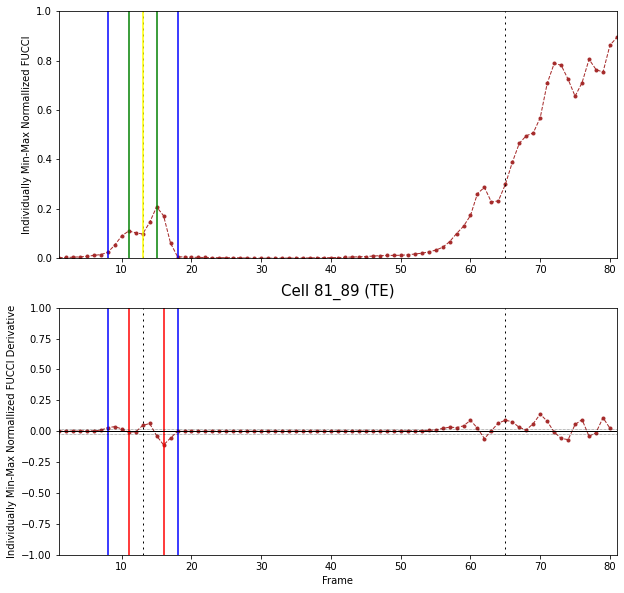

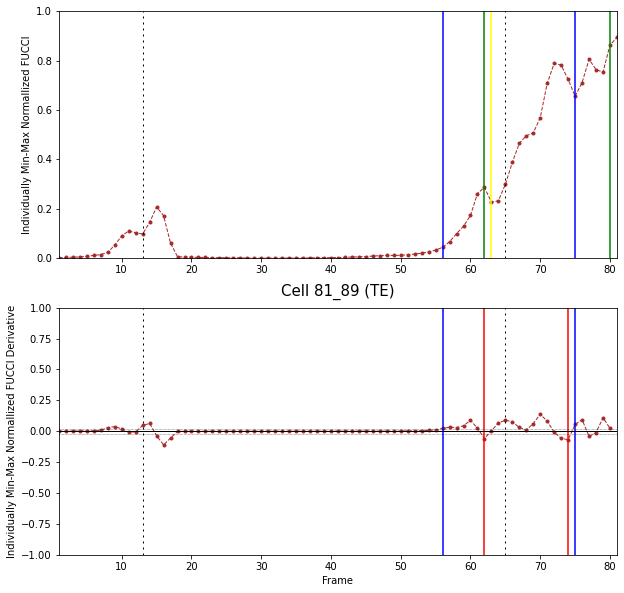

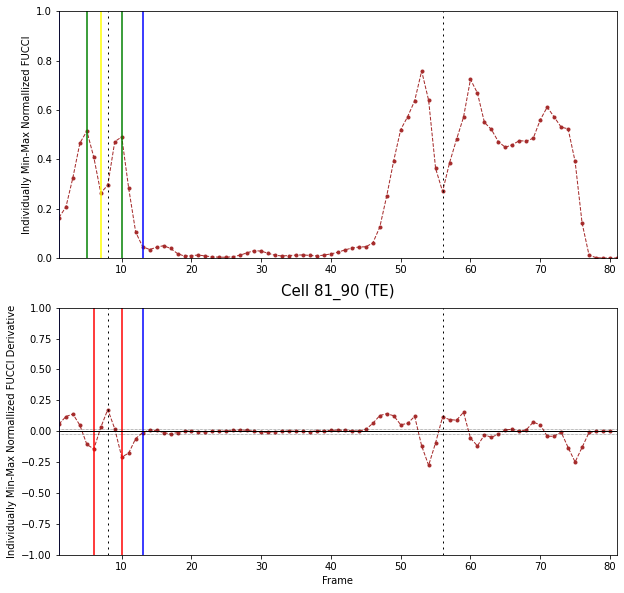

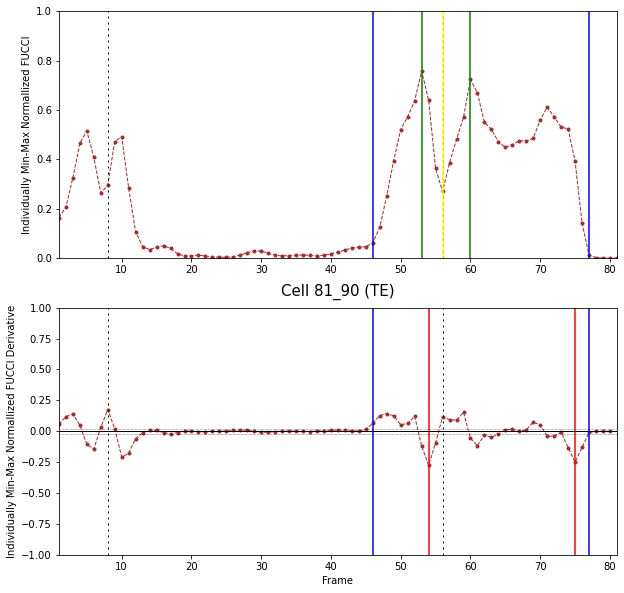

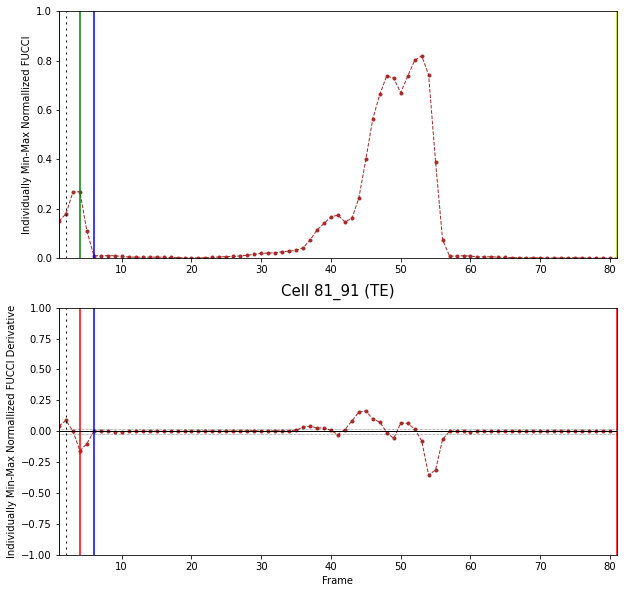

ERROR: Requested division does not occur in requested trace


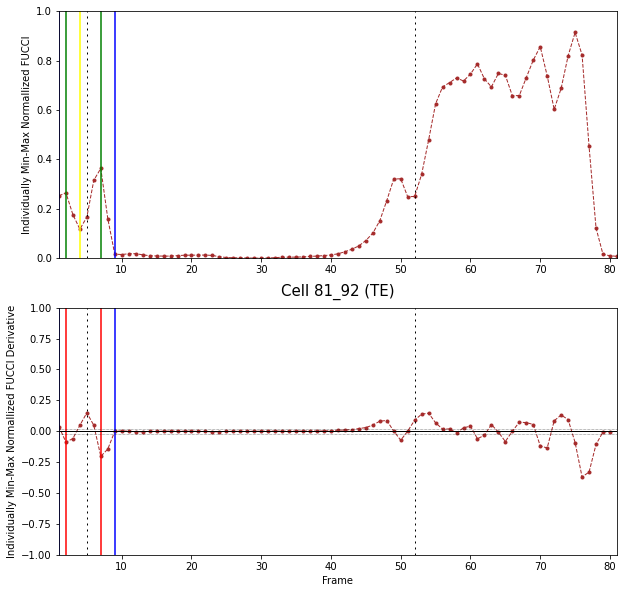

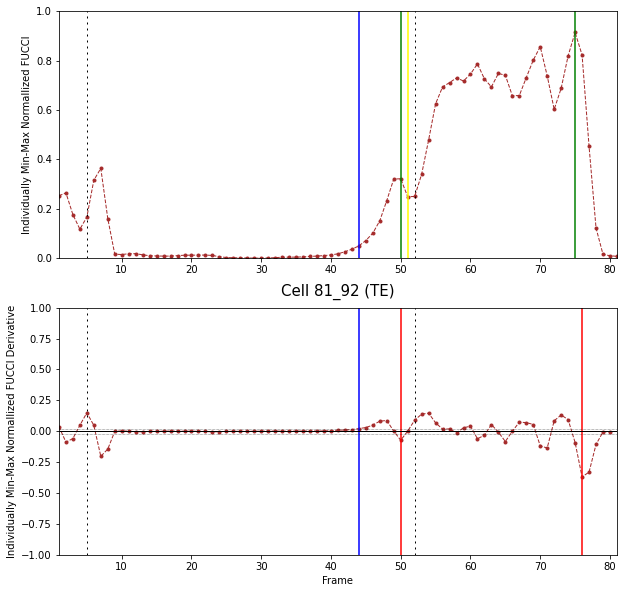

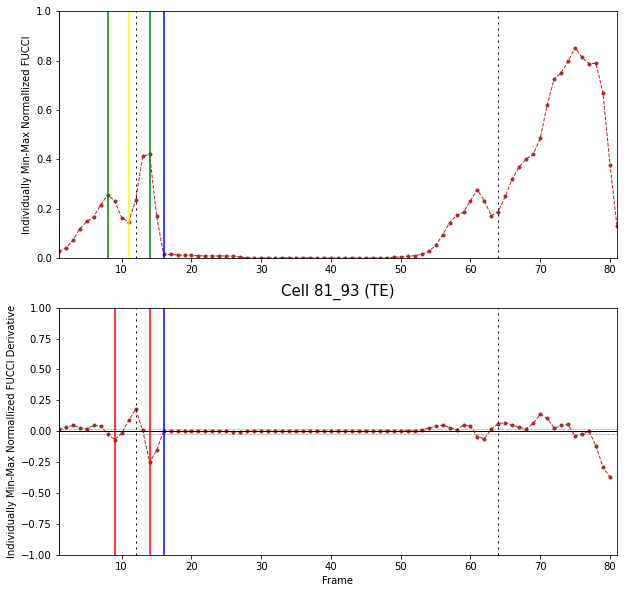

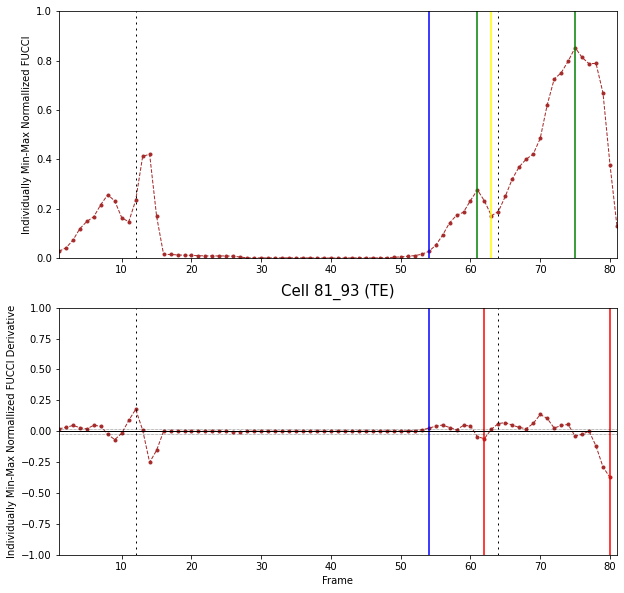

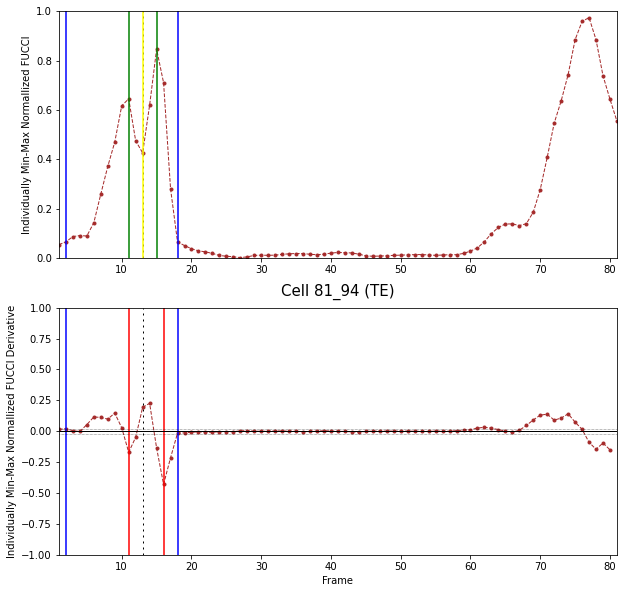

ERROR: Requested division does not occur in requested trace


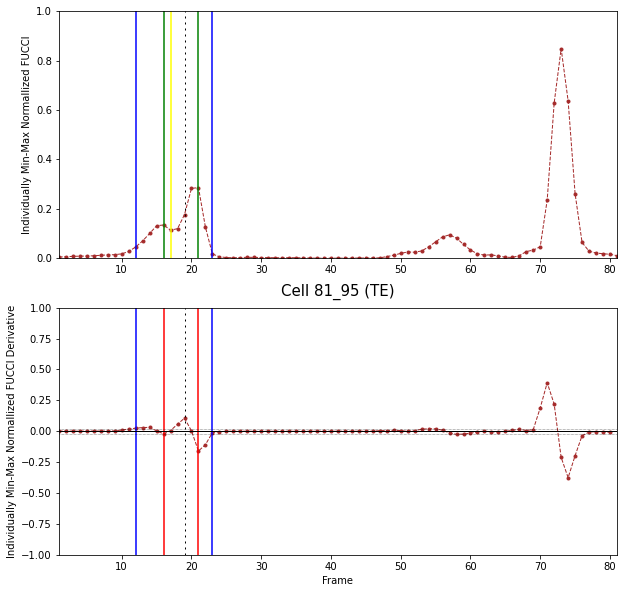

ERROR: Requested division does not occur in requested trace


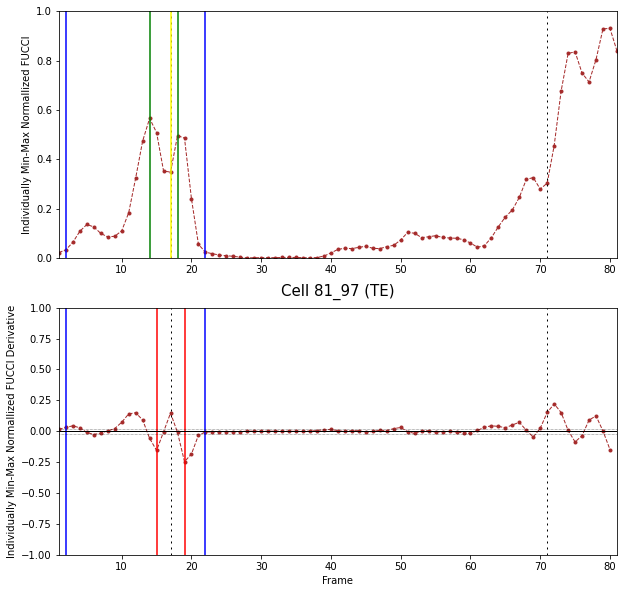

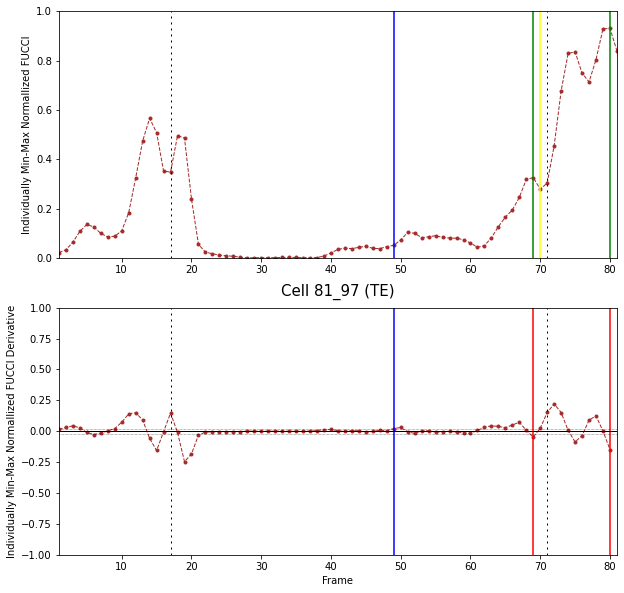

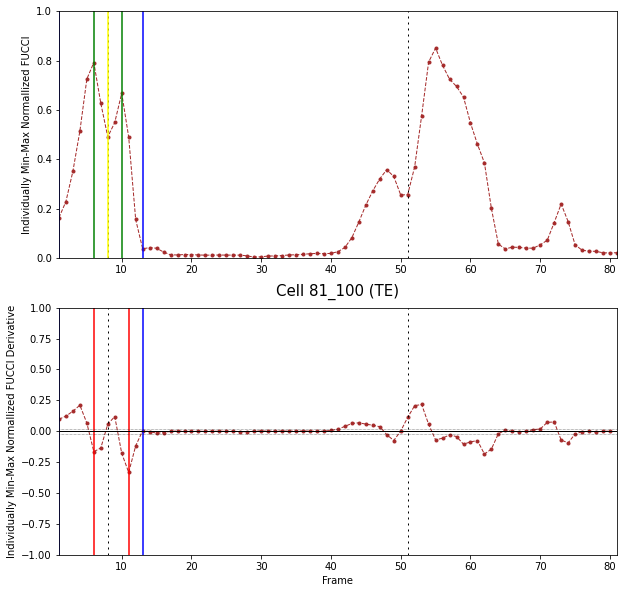

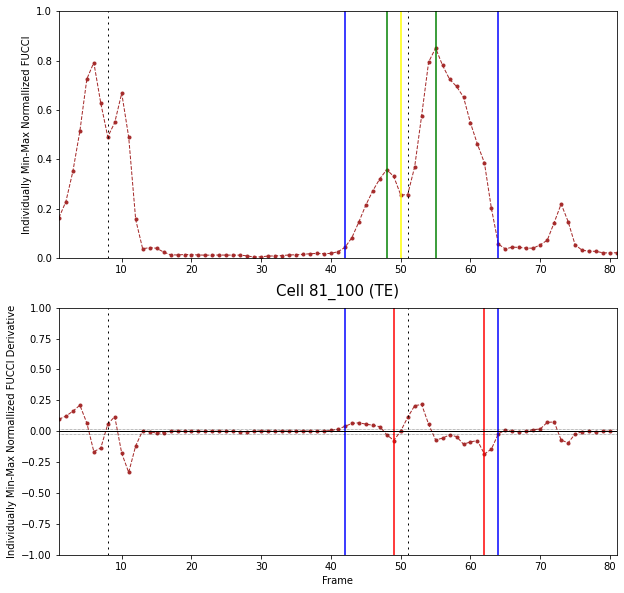

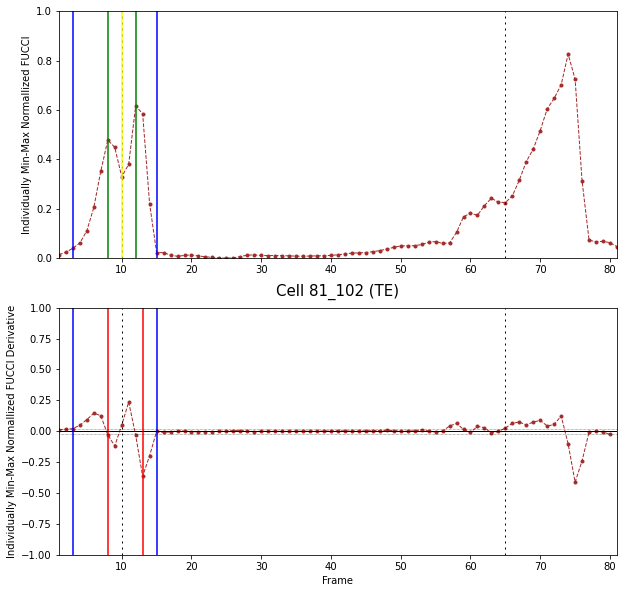

...

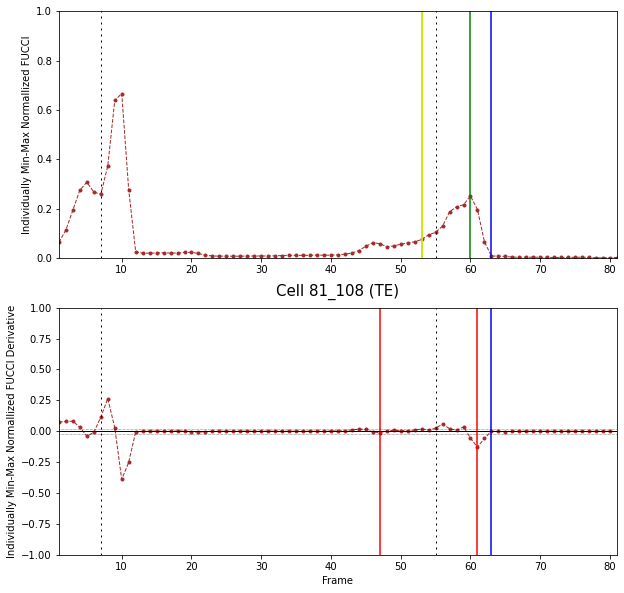

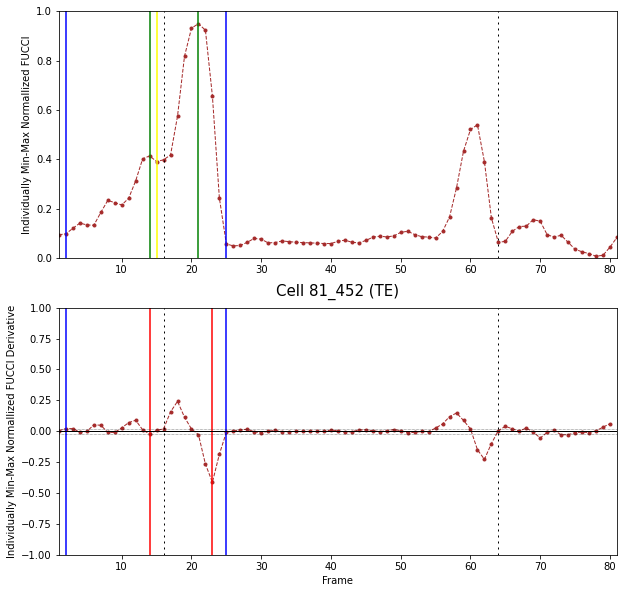

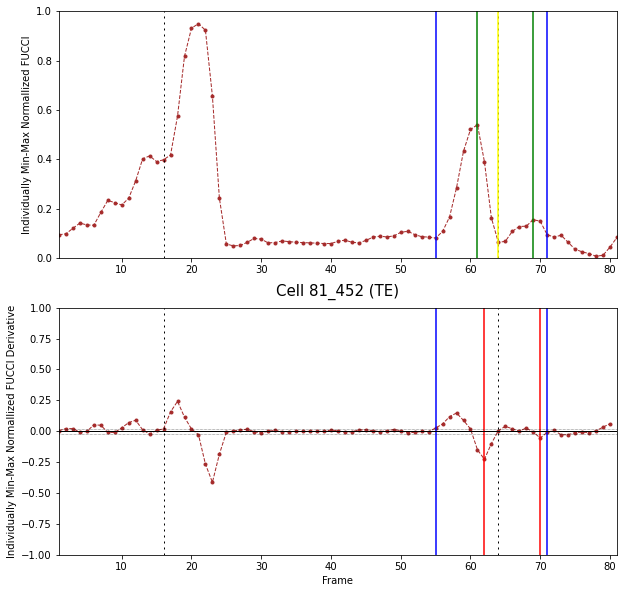

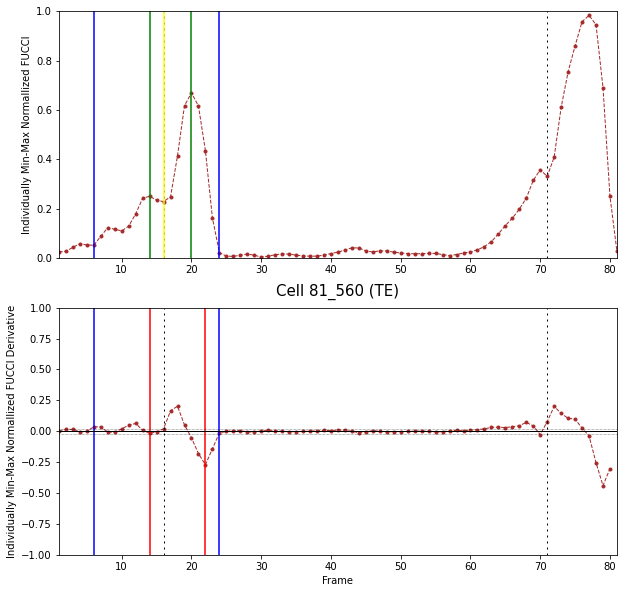

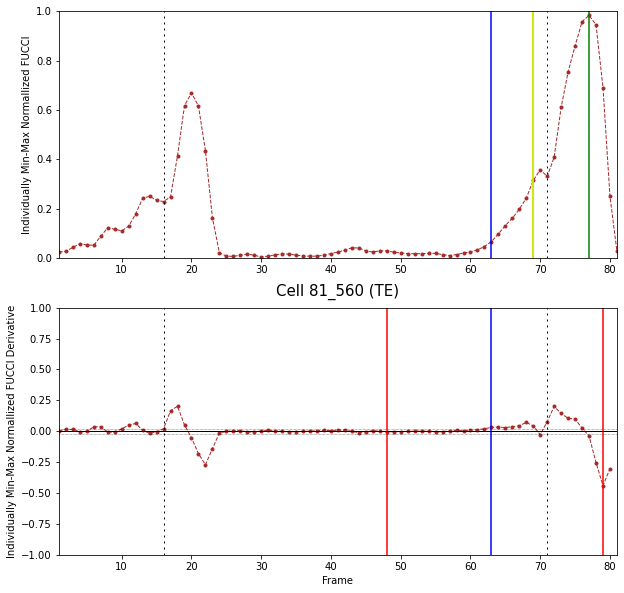

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


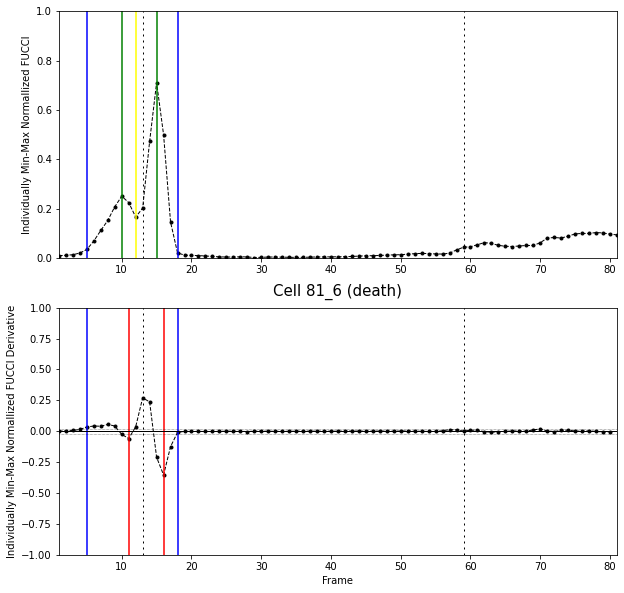

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


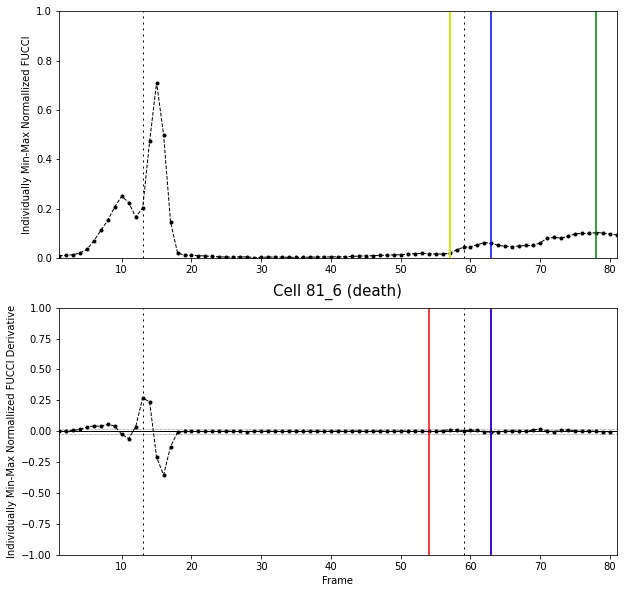

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


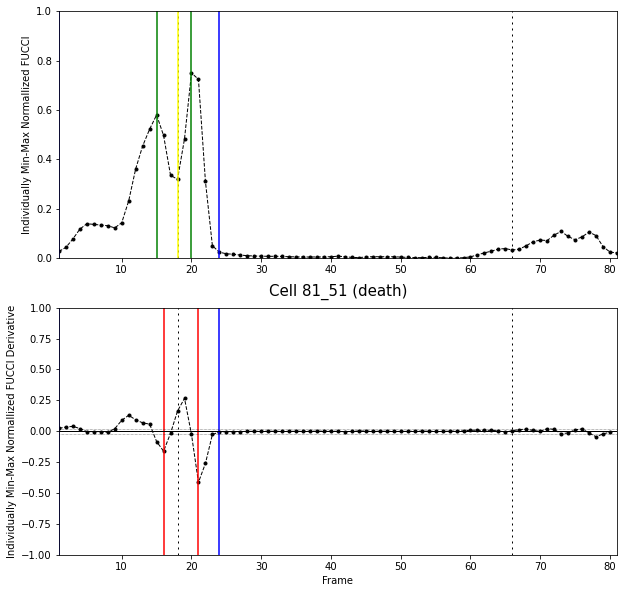

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


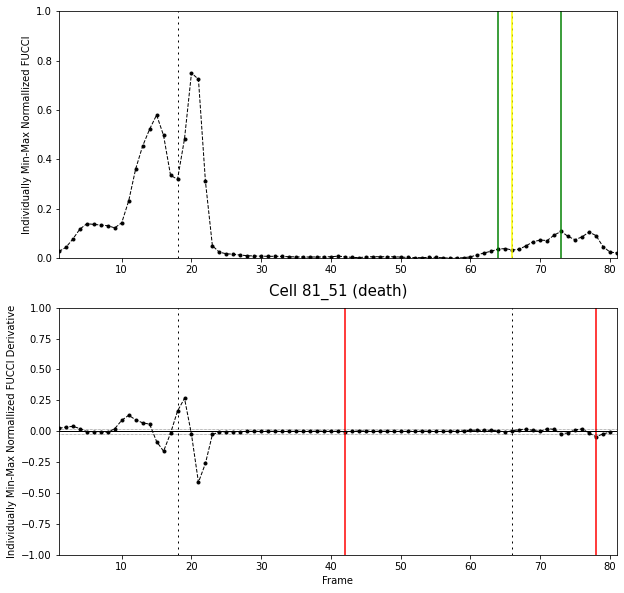

In [34]:
# make plots for all cells and divisions
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 64, makeplots = True, savefig = [True, plot_path])
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 128, makeplots = True, savefig = [True, plot_path])

ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requ

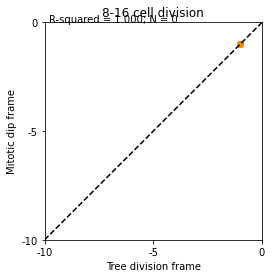

In [60]:
div_16 = []
g2_16 = []
mito_16 = []
g1_16 = []
mito_counter = 0
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 16, makeplots = False, savefig = [False, plot_path])
        div_16.append(temp_calls[0])
        g2_16.append(temp_calls[1])
        mito_16.append(temp_calls[2])
        if temp_calls[2] >= 0:
            mito_counter += 1
        g1_16.append(temp_calls[3])

min_val = min(min(div_16), min(mito_16))
max_val = max(max(div_16), max(mito_16))
min_val = (min_val // 10) * 10
max_val = (max_val // 10 + 1) * 10

plt.scatter(div_16, mito_16, color='darkorange')
plt.xlabel('Tree division frame')
plt.ylabel('Mitotic dip frame')
plt.title('8-16 cell division')
plt.annotate("R-squared = {:.3f}".format(r2_score(div_16, mito_16)) + '; N = ' + str(mito_counter), (0.98 * min_val, 0.90 * max_val))
plt.axline((0, 0), slope=1, color = 'k', linestyle='--')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

plt.gca().yaxis.set_ticks(np.arange(min_val, max_val + 5, 5))
plt.gca().xaxis.set_ticks(np.arange(min_val, max_val + 5, 5))
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().set_aspect('equal')

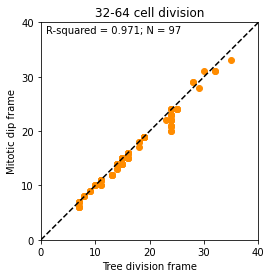

In [80]:
div_32 = []
g2_32 = []
mito_32 = []
g1_32 = []
mito_counter = 0
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 64, makeplots = False, savefig = [False, plot_path])
        div_32.append(temp_calls[0])
        g2_32.append(temp_calls[1])
        mito_32.append(temp_calls[2])
        if temp_calls[2] >= 0:
            mito_counter += 1
        g1_32.append(temp_calls[3])

min_val = min(min(div_32), min(mito_32))
max_val = max(max(div_32), max(mito_32))
min_val = (min_val // 10) * 10
max_val = (max_val // 10 + 1) * 10

plt.scatter(div_32, mito_32, color='darkorange')
plt.xlabel('Tree division frame')
plt.ylabel('Mitotic dip frame')
plt.title('32-64 cell division')
plt.annotate("R-squared = {:.3f}".format(r2_score(div_32, mito_32)) + '; N = ' + str(mito_counter), (1.05 * min_val + 1, 0.95 * max_val))
plt.axline((0, 0), slope=1, color = 'k', linestyle='--')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

plt.gca().yaxis.set_ticks(np.arange(min_val, max_val+10, 10))
plt.gca().xaxis.set_ticks(np.arange(min_val, max_val+10, 10))
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().set_aspect('equal')

ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace


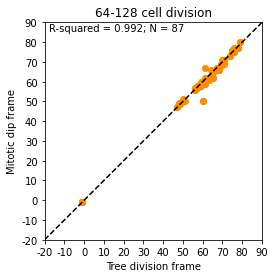

In [76]:
div_64 = []
g2_64 = []
mito_64 = []
g1_64 = []
mito_counter = 0
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 128, makeplots = False, savefig = [False, plot_path])
        div_64.append(temp_calls[0])
        g2_64.append(temp_calls[1])
        mito_64.append(temp_calls[2])
        if temp_calls[2] > 0:
            mito_counter += 1
        g1_64.append(temp_calls[3])

min_val = min(min(div_64), min(mito_64))
max_val = max(max(div_64), max(mito_64))
min_val = (min_val // 10 - 1) * 10
max_val = (max_val // 10 + 1) * 10

plt.scatter(div_64, mito_64, color='darkorange')
plt.xlabel('Tree division frame')
plt.ylabel('Mitotic dip frame')
plt.title('64-128 cell division')
plt.annotate("R-squared = {:.3f}".format(r2_score(div_64, mito_64)) + '; N = ' + str(mito_counter), (0.9 * min_val, 0.95 * max_val))
plt.axline((0, 0), slope=1, color = 'k', linestyle='--')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

plt.gca().yaxis.set_ticks(np.arange(min_val, max_val + 10, 10))
plt.gca().xaxis.set_ticks(np.arange(min_val, max_val + 10, 10))
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().set_aspect('equal')

In [35]:
def annotate_trace(raw_traces, deriv_traces, cell_ID, smoothing = ['inverse', 1], makeplots = False, savefig = [False, 'null']):
    # find and format data of the queried cell
    fate_index = -1
    cell_index = -1
    cell_name = str(cell_ID[0]) + '_' + str(cell_ID[1])
    
    cnt = 0
    for fates in raw_traces:
        if cell_name in fates[1][1]:
            fate_index = cnt
            cell_index = fates[1][1].index(cell_name)
        cnt += 1
    
    temp_frames = raw_traces[fate_index][1][0][cell_index][0]
    temp_smooth = smoothen_trace(raw_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_derivs = smoothen_trace(deriv_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_divs = raw_traces[fate_index][1][2][cell_index]
    
    # annotate trace features
    pre_threshs = []
    mitotic_dips = []
    post_threshs = []
    
    for a_div in temp_divs:
        div_frame = a_div[0]
        div_frame_index = temp_frames.index(div_frame)

        permit = 25
        pre_div_peak = [-1, -999]
        pre_div_dip = [-1, 999]
        for i in range(max(div_frame_index - permit, 0), div_frame_index - 1, 1):
            if temp_smooth[i] > pre_div_peak[1]:
                pre_div_peak[0] = i
                pre_div_peak[1] = temp_smooth[i]
            if temp_derivs[i] < pre_div_dip[1]:
                pre_div_dip[0] = i
                pre_div_dip[1] = temp_derivs[i]

        post_div_peak = [-1, -999]
        post_div_dip = [-1, 999]
        for i in range(div_frame_index + 1, min(div_frame_index + permit, len(temp_frames) - 1), 1):
            if temp_smooth[i] > post_div_peak[1]:
                post_div_peak[0] = i
                post_div_peak[1] = temp_smooth[i]
            if temp_derivs[i] < post_div_dip[1]:
                post_div_dip[0] = i
                post_div_dip[1] = temp_derivs[i]

        mitotic_dip = [-1, 999]
        for i in range(pre_div_peak[0], post_div_peak[0], 1):
            if temp_smooth[i] < mitotic_dip[1]:
                mitotic_dip[0] = i
                mitotic_dip[1] = temp_smooth[i]

        pre_div_thresh = [-1, False]
        i = max(div_frame_index - permit, 0)
        while not pre_div_thresh[1] and i < div_frame_index:
            if temp_derivs[i] >= deriv_thresh:
                pre_div_thresh[1] = True
                pre_div_thresh[0] = i
            i += 1

        post_div_thresh = [-1, False]
        i =  post_div_dip[0]
        while not post_div_thresh[1] and i < min(div_frame_index + permit, len(temp_derivs) - 1):
            if temp_derivs[i] >= -1 * deriv_thresh:
                post_div_thresh[1] = True
                post_div_thresh[0] = i
            i += 1
        
        pre_threshs.append(pre_div_thresh)
        mitotic_dips.append(mitotic_dip)
        post_threshs.append(post_div_thresh)
    
    # format annotations
    
    out_pre_threshs = []
    for obj in pre_threshs:
        if obj[1]:
            out_pre_threshs.append(temp_frames[obj[0]])
    out_mitotic_dips = []
    for obj in mitotic_dips:
        if obj[0] >= 0:
            out_mitotic_dips.append(temp_frames[obj[0]])
    out_post_threshs = []
    for obj in post_threshs:
        if obj[1]:
            out_post_threshs.append(temp_frames[obj[0]])
    
    # make annotated plots
    if makeplots:
        plt.figure(figsize=(10, 10))

        plt.subplot(2, 1, 1)
        plt.plot(temp_frames, temp_smooth, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        for obj in out_pre_threshs:
            plt.axvline(x = obj, c = 'k')
        for obj in out_mitotic_dips:
            plt.axvline(x = obj, c = 'k')
        for obj in out_post_threshs:
            plt.axvline(x = obj, c = 'k')

        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI')

        plt.subplot(2, 1, 2)
        plt.plot(deriv_traces[fate_index][1][0][cell_index][0], temp_derivs, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        # draw tree-based division lines
        for division in temp_divs:
            plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        # draw annotated events
        for obj in out_pre_threshs:
            plt.axvline(x = obj, c = 'k')
        for obj in out_post_threshs:
            plt.axvline(x = obj, c = 'k')

        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.axhline(y = deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = -1 * deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.ylim(-0.5, 0.5)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI Derivative')
        plt.xlabel('Frame')
        plt.title('Cell ' + cell_name + ' (' + fate[fate_index] + ')', fontsize = 15, y = 1.025)

        # save out the plots
        if savefig[0]:
            temp_name = fate[fate_index] + '_' + cell_name + '_full.png'
            plt.savefig(os.path.join(savefig[1], temp_name))

        plt.show()
    
    return [out_pre_threshs, out_mitotic_dips, out_post_threshs]

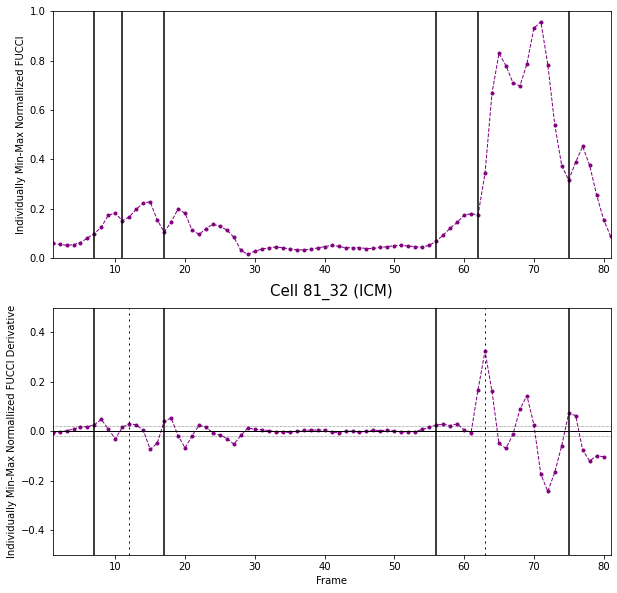

In [36]:
test_calls = annotate_trace(indiv_norm_traces, indiv_norm_derivs, [81, 32], makeplots = True, savefig = [False, plot_path])

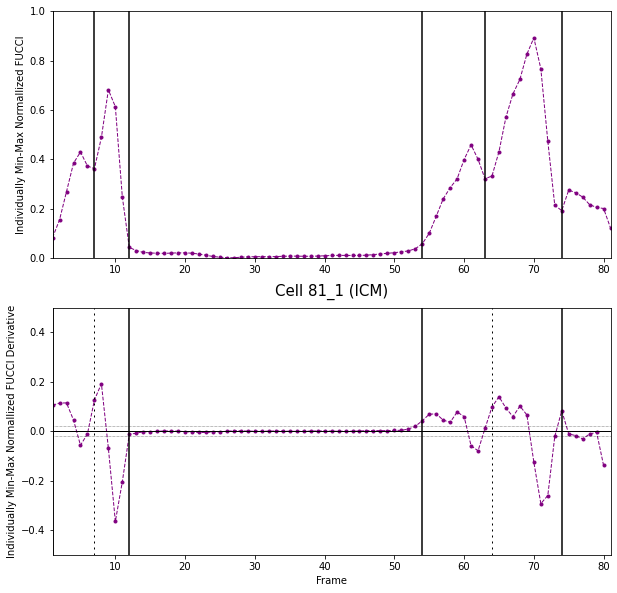

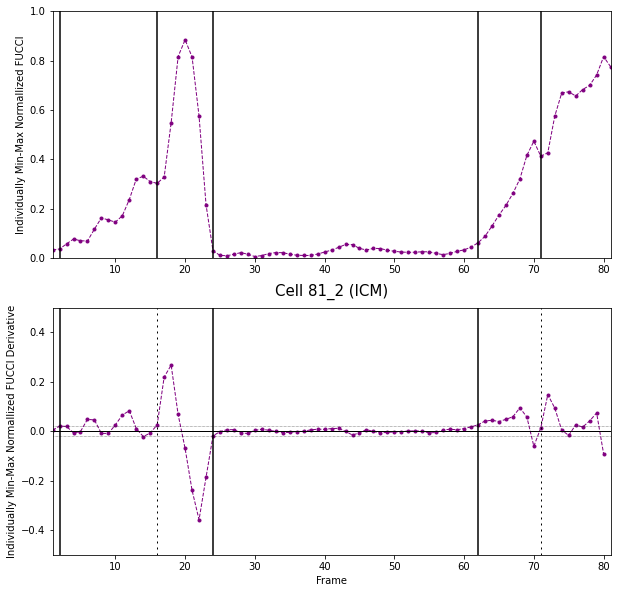

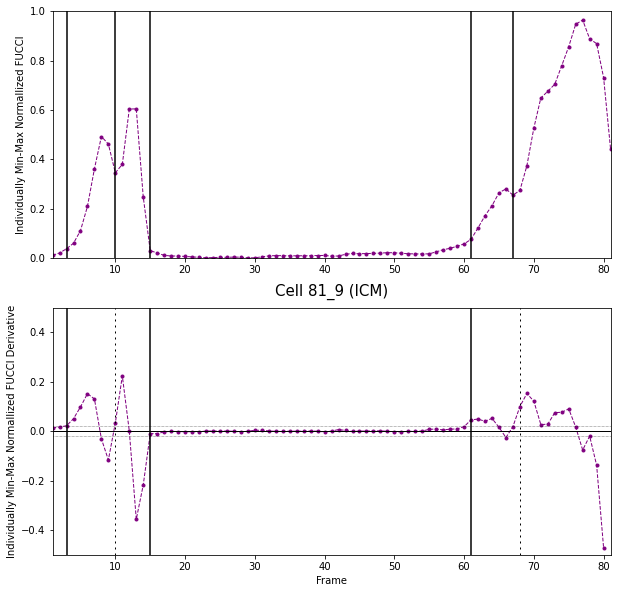

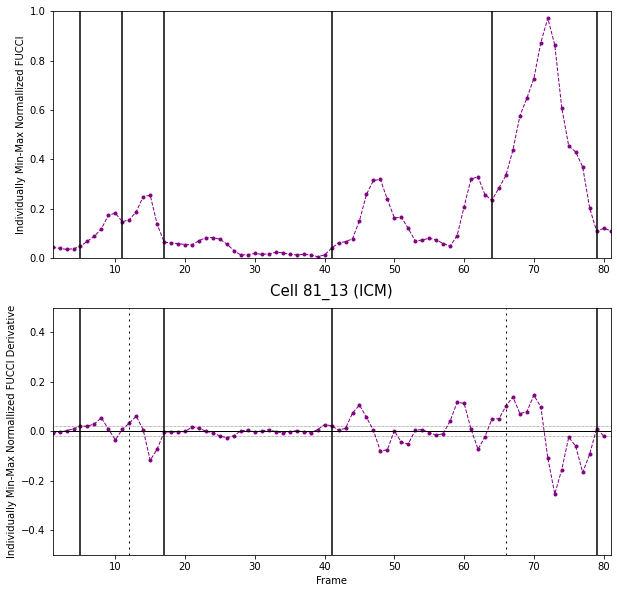

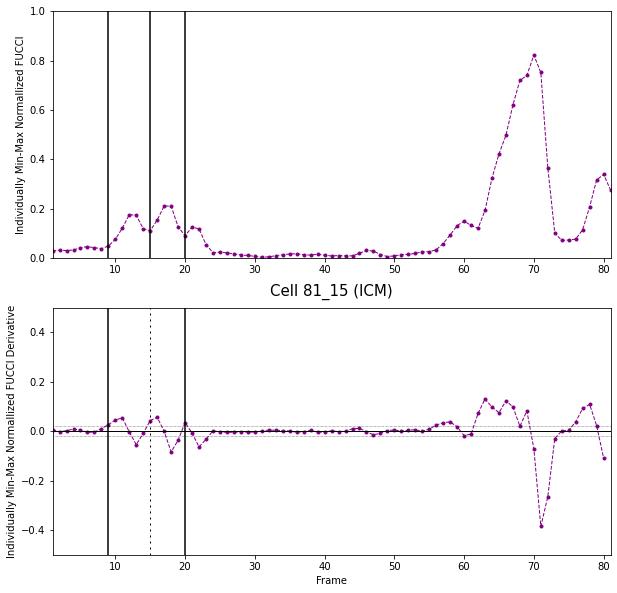

...

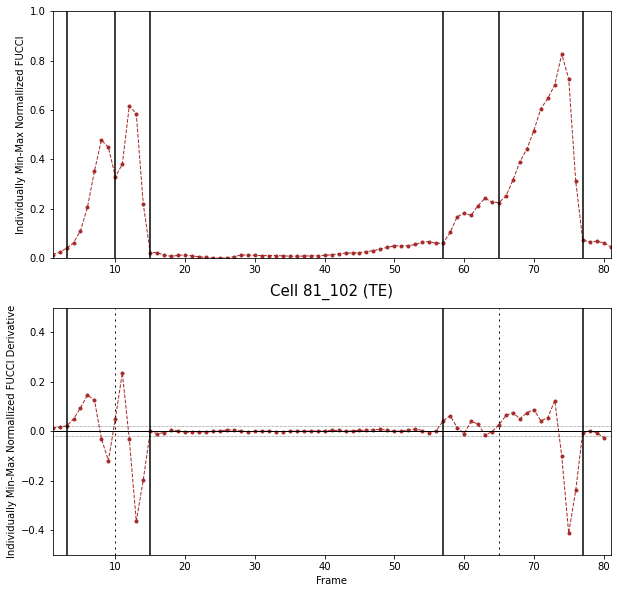

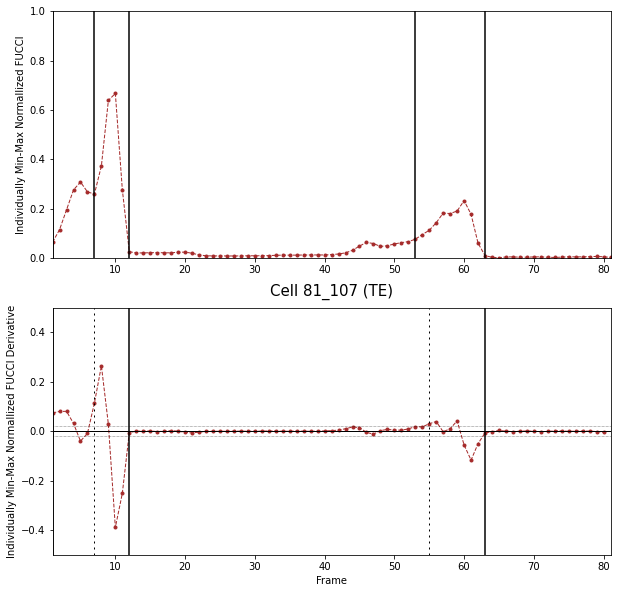

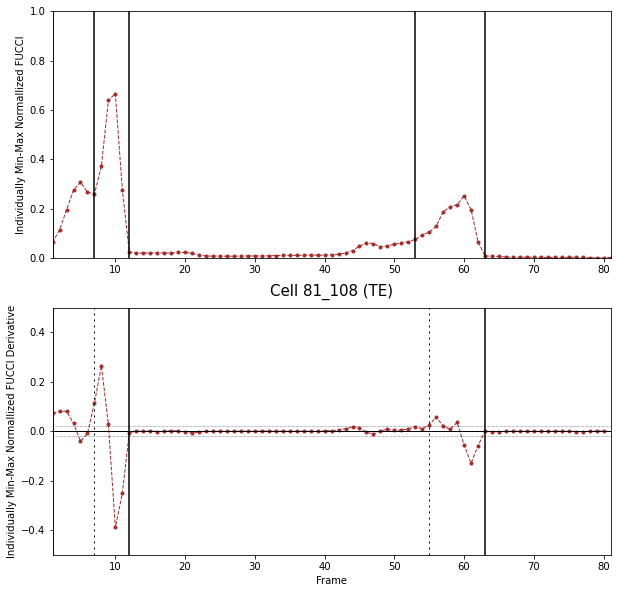

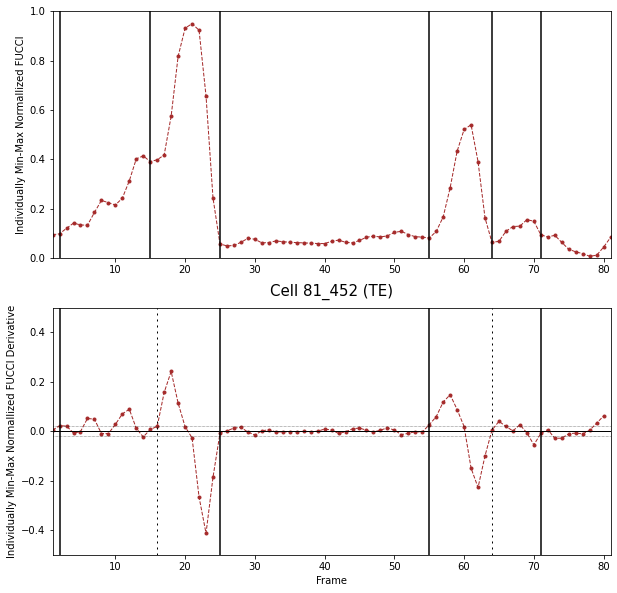

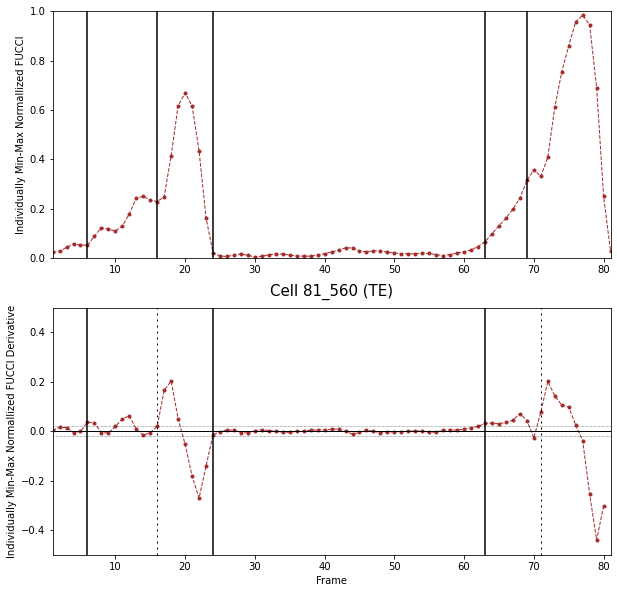

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


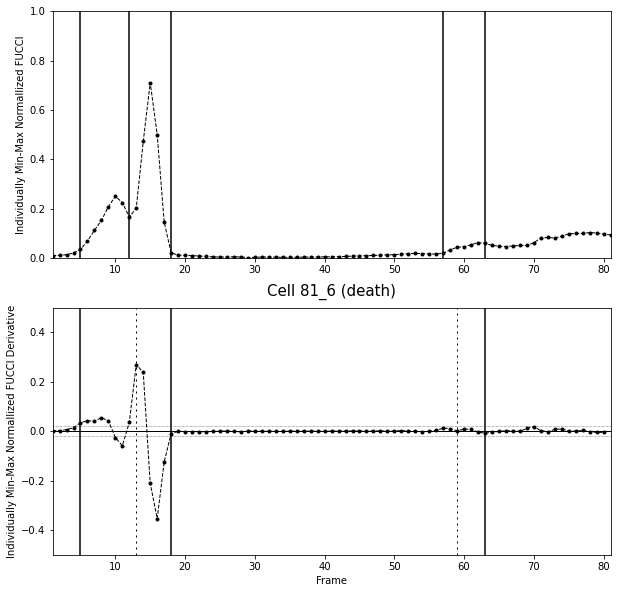

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


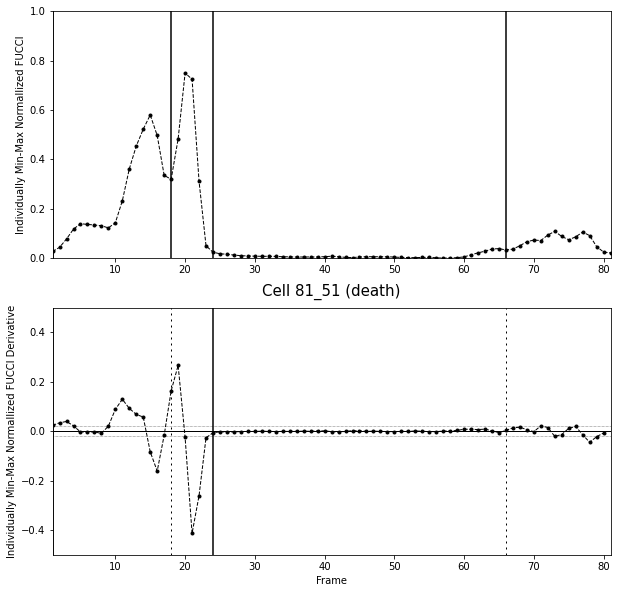

In [37]:
# make plots for all cells
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        test_calls = annotate_trace(indiv_norm_traces, indiv_norm_derivs, cell[0], makeplots = True, savefig = [True, plot_path])

In [38]:
all_calls = []
all_cells = []
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        test_calls = annotate_trace(indiv_norm_traces, indiv_norm_derivs, cell[0], makeplots = False, savefig = [False, plot_path])
        all_calls.append(test_calls)
        all_cells.append(cell[0])
        print(cell[0], '>>', test_calls)

[81, 1] >> [[1, 54], [7, 63], [12, 74]]
[81, 2] >> [[2, 62], [16, 71], [24]]
[81, 9] >> [[3, 61], [10, 67], [15]]
[81, 13] >> [[5, 41], [11, 64], [17, 79]]
[81, 15] >> [[9], [15], [20]]
[81, 25] >> [[10, 65], [17, 74], [24]]
[81, 30] >> [[1, 63], [17, 70], [24]]
[81, 32] >> [[7, 56], [11, 62], [17, 75]]
[81, 57] >> [[1, 63], [17, 71], [24]]
[81, 59] >> [[3, 57], [10, 64], [15, 78]]
[81, 60] >> [[10, 65], [17, 74], [24]]
[81, 77] >> [[44], [43], [56]]
[81, 78] >> [[3, 60], [17, 68], [22, 79]]
[81, 88] >> [[4, 67], [17], [22, 1]]
[81, 96] >> [[4, 67], [17], [22, 1]]
[81, 98] >> [[1, 61], [13, 77], [28]]
[81, 99] >> [[1], [18, 66], [24, 74]]
[81, 103] >> [[1, 45], [5, 55], [10, 74]]
[81, 104] >> [[1, 53], [7, 63], [12, 76]]
[81, 105] >> [[2, 40], [13, 63], [18, 74]]
[81, 106] >> [[8, 62], [11, 62], [17, 75]]
[81, 4] >> [[4, 61], [10, 67], [15]]
[81, 5] >> [[1, 61], [13, 77], [28]]
[81, 8] >> [[2, 40], [13, 63], [18, 74]]
[81, 10] >> [[1, 40], [5, 45], [10, 61]]
[81, 11] >> [[1, 41], [4, 4

In [39]:
def label_annotations_forward(events, first_division = 64, check_initial_g2 = True): # transforms list of trace annotations into labeled cell cycle phases
    new_events = copy.deepcopy(events)
    stage_events = [str(first_division) + 'cellstage']
    mitosis = 0
    initial_g2_acquired = False
    
    if check_initial_g2:
        if len(events[0]) > 0 and events[0][0] < events[1][0]:
            if events[0][0] > 1:
                first_division = int(first_division / 2)
                stage_events = [str(first_division) + 'cellstage']
                g2 = events[0][0]
                stage_events.append(g2)
                new_events[0].pop(new_events[0].index(g2))
            else:
                first_division = int(first_division / 2)
                stage_events = []
                new_events[0].pop(0)
            initial_g2_acquired = True
    
    if not initial_g2_acquired:
        if len(events[1]) > 0:
            mitosis = events[1][0]
            stage_events.append(mitosis)
            new_events[1].pop(0)

        if len(events[2]) > 0:
            g1_tmp = 999
            for event in events[2]:
                if (event > mitosis) and ((event - mitosis) < (g1_tmp - mitosis)):
                    g1_tmp = event
            if g1_tmp < 999:
                g1 = g1_tmp
                stage_events.append(g1)
                new_events[2].pop(new_events[2].index(g1))

        if len(events[0]) > 0:
            g2_tmp = 999
            for event in events[0]:
                if (event > mitosis) and ((event - mitosis) < (g2_tmp - mitosis)):
                    g2_tmp = event
            if g2_tmp < 999:
                g2 = g2_tmp
                stage_events.append(g2)
                new_events[0].pop(new_events[0].index(g2))
    
    if len(stage_events) == 1:
        out = []
    else:
        out = label_annotations_forward(new_events, int(first_division * 2), check_initial_g2 = False)
        out.append(stage_events)
        
    return out

In [40]:
testrun = label_annotations_forward(all_calls[1])
testrun.reverse()

In [41]:
print(all_calls[1])
print(testrun)

[[2, 62], [16, 71], [24]]
[['32cellstage', 2], ['64cellstage', 16, 24, 62], ['128cellstage', 71]]


In [42]:
counter = 0
annotations = []

for calls in all_calls:
    if len(calls[1])>0:
        tmp = label_annotations_forward(calls)
        tmp.reverse()
        annotations.append(tmp)

        cell_id = str(all_cells[counter][0]) + '_' + str(all_cells[counter][1])
        tmp = [cell_id] + tmp
        print(tmp)
        counter += 1

['81_1', [], ['64cellstage', 7, 12, 54], ['128cellstage', 63, 74]]
['81_2', ['32cellstage', 2], ['64cellstage', 16, 24, 62], ['128cellstage', 71]]
['81_9', ['32cellstage', 3], ['64cellstage', 10, 15, 61], ['128cellstage', 67]]
['81_13', ['32cellstage', 5], ['64cellstage', 11, 17, 41], ['128cellstage', 64, 79]]
['81_15', ['32cellstage', 9], ['64cellstage', 15, 20]]
['81_25', ['32cellstage', 10], ['64cellstage', 17, 24, 65], ['128cellstage', 74]]
['81_30', [], ['64cellstage', 17, 24, 63], ['128cellstage', 70]]
['81_32', ['32cellstage', 7], ['64cellstage', 11, 17, 56], ['128cellstage', 62, 75]]
['81_57', [], ['64cellstage', 17, 24, 63], ['128cellstage', 71]]
['81_59', ['32cellstage', 3], ['64cellstage', 10, 15, 57], ['128cellstage', 64, 78]]
['81_60', ['32cellstage', 10], ['64cellstage', 17, 24, 65], ['128cellstage', 74]]
['81_77', ['64cellstage', 43, 56, 44]]
['81_78', ['32cellstage', 3], ['64cellstage', 17, 22, 60], ['128cellstage', 68, 79]]
['81_88', ['32cellstage', 4], ['64cellstage',

In [43]:
print(annotations[0])
print(calls)

[[], ['64cellstage', 7, 12, 54], ['128cellstage', 63, 74]]
[[1], [18, 66], [24]]


In [44]:
anno_writer = []
counter = 0
for anno in annotations:
    new_anno = [str(all_cells[counter][0]) + '_' + str(all_cells[counter][1])]

    cnt = 0
    for stage in anno:
        if len(stage) < 1:
            new_anno.append(-1)
        else:
            for i in range(len(stage) - 1):
                new_anno.append(stage[i + 1])
            if cnt == len(anno) - 1:
                for i in range(4 - len(stage)):
                    new_anno.append(-1)
        cnt += 1
        
    anno_writer.append(new_anno)
    print(new_anno)
    counter += 1

['81_1', -1, 7, 12, 54, 63, 74, -1]
['81_2', 2, 16, 24, 62, 71, -1, -1]
['81_9', 3, 10, 15, 61, 67, -1, -1]
['81_13', 5, 11, 17, 41, 64, 79, -1]
['81_15', 9, 15, 20, -1]
['81_25', 10, 17, 24, 65, 74, -1, -1]
['81_30', -1, 17, 24, 63, 70, -1, -1]
['81_32', 7, 11, 17, 56, 62, 75, -1]
['81_57', -1, 17, 24, 63, 71, -1, -1]
['81_59', 3, 10, 15, 57, 64, 78, -1]
['81_60', 10, 17, 24, 65, 74, -1, -1]
['81_77', 43, 56, 44]
['81_78', 3, 17, 22, 60, 68, 79, -1]
['81_88', 4, 17, 22, 67, 1, -1, -1]
['81_96', 4, 17, 22, 67, 1, -1, -1]
['81_98', -1, 13, 28, 61, 77, -1, -1]
['81_99', -1, 18, 24, 66, 74, -1]
['81_103', -1, 5, 10, 45, 55, 74, -1]
['81_104', -1, 7, 12, 53, 63, 76, -1]
['81_105', 2, 13, 18, 40, 63, 74, -1]
['81_106', 8, 11, 17, 62, 62, 75, -1]
['81_4', 4, 10, 15, 61, 67, -1, -1]
['81_5', -1, 13, 28, 61, 77, -1, -1]
['81_8', 2, 13, 18, 40, 63, 74, -1]
['81_10', -1, 5, 10, 40, 45, 61, -1]
['81_11', -1, 4, 10, 41, 47, 59, -1]
['81_12', 4, 10, 42, 54, 69, -1]
['81_14', -1, 8, 13, 47, 52, 63, 

In [45]:
out_file = os.path.join(stack_path, 'annotations.csv')
with open(out_file, 'w', newline='') as csvfile:
    csv_writer = csv.writer(csvfile)
    csv_writer.writerows(anno_writer)

In [43]:
print(fate_data[0][1][5][1][0])

[1, 9, 922.848350937702, 1016.4297262341, 51.0075447294676, 187.939965509808, 152.65585255443]
